In [182]:
# !pip install pandarallel
# !pip install pywer
# !pip install pyjarowinkler
# !pip install pywer
# !pip install pyjarowinkler



In [183]:
import pandas as pd
# from pandarallel import pandarallel

# Initialization
pandarallel.initialize()
from tqdm import tqdm
tqdm.pandas()
import os
import json
import pywer
from pyjarowinkler import distance as jwdistance
from tqdm import tqdm

class Const:
    OCR = 'ocr'
    GROUND = 'groundtruth'
    REGION = 'region'
    LINE = 'line'
    SENTENCE = 'sentence'
    FILE = 'filename'
    DATASET = 'dataset_name'
    PREDICTION = 'prediction'
    PROMPT = 'prompt'
    LANGUAGE = 'language'
    NONE = None


INFO: Pandarallel will run on 24 workers.
INFO: Pandarallel will use Memory file system to transfer data between the main process and workers.


### Lookup datasets

In [184]:
datasets = []

for type_document in ['ocr', 'htr', 'asr']:
    for root, dirs, files in os.walk(f'../data/datasets/{type_document}/converted'):
        for file in files:
            if file.endswith(".jsonl"):
                input_file = os.path.join(root, file)
                if 'sample' not in input_file:
                    with open(input_file) as f:
                        lines = f.read().splitlines()
                    df_inter = pd.DataFrame(lines)
                    df_inter.columns = ['json_element']
                    df_inter['json_element'].apply(json.loads)
                    df = pd.json_normalize(df_inter['json_element'].apply(json.loads))

                    dataset_name = root.split('/')[-1].replace('_', '-')
                    print(input_file, dataset_name)
                    df['dataset_name'] = [dataset_name] * len(df)
                    if 'ajmc' in dataset_name:
                        df['language'] = ['el'] * len(df)
                    if 'overproof' in dataset_name:
                        df['language'] = ['en'] * len(df)
                    if 'impresso' in dataset_name:
                        df['language'] = ['de'] * len(df)

                    datasets.append(df)
            

../data/datasets/ocr/converted/icdar-2019/icdar-2019.jsonl icdar-2019
../data/datasets/ocr/converted/ajmc-primary/ajmc_primary_text.jsonl ajmc-primary
../data/datasets/ocr/converted/overproof/overproof.jsonl overproof
../data/datasets/ocr/converted/ajmc-mixed/ajmc_mixed.jsonl ajmc-mixed
../data/datasets/ocr/converted/impresso/impresso-nzz.jsonl impresso
../data/datasets/ocr/converted/icdar-2017/icdar-2017.jsonl icdar-2017
../data/datasets/htr/converted/htrec/htrec.jsonl htrec
../data/datasets/asr/converted/ina/ina.jsonl ina


In [185]:
print('Number of unique lines/sentences/regions.\n')
for dataset in datasets:
    print('Dataset:', dataset['dataset_name'].unique()[0], len(dataset), 'with duplicates')
    print('No. lines:', dataset['ocr.line']. nunique(), '/', len(dataset['ocr.sentence']), 
          'No. sentences:', dataset['ocr.sentence']. nunique(), '/', len(dataset['ocr.sentence']), 
          'No. regions:', dataset['ocr.region']. nunique(), '/', len(dataset['ocr.region']))
    print('-'*80)

Number of unique lines/sentences/regions.

Dataset: icdar-2019 404 with duplicates
No. lines: 0 / 404 No. sentences: 404 / 404 No. regions: 41 / 404
--------------------------------------------------------------------------------
Dataset: ajmc-primary 57 with duplicates
No. lines: 40 / 57 No. sentences: 27 / 57 No. regions: 9 / 57
--------------------------------------------------------------------------------
Dataset: overproof 2669 with duplicates
No. lines: 2278 / 2669 No. sentences: 399 / 2669 No. regions: 41 / 2669
--------------------------------------------------------------------------------
Dataset: ajmc-mixed 1291 with duplicates
No. lines: 535 / 1291 No. sentences: 379 / 1291 No. regions: 33 / 1291
--------------------------------------------------------------------------------
Dataset: impresso 1563 with duplicates
No. lines: 1256 / 1563 No. sentences: 577 / 1563 No. regions: 203 / 1563
--------------------------------------------------------------------------------
Dataset

## Step 1: Loading of Results


In [186]:
def read_line_by_line(filename):
    pass

def json_load(text):
    
    try:
        loaded_line = json.loads(text)
    except Exception as ex:
        print(ex)
        print(text[:30], '...')
        loaded_line = 'No text'
    return loaded_line

In [187]:
def get_icdar_2017_lang(filename):
    lang = filename.split('/')[-2].split('_')[0]
    if lang =='eng':
        lang = 'en'
    return lang

In [189]:
import gc; gc.collect()

0

In [190]:
from tqdm import tqdm
import os

results, results_backup = [], []

# First traversal to get count of .jsonl files
jsonl_count = 0
for root, dirs, files in os.walk('../data/output'):
    for file in files:
        if file.endswith(".jsonl"):
            jsonl_count += 1

# Second traversal to do the processing with tqdm progress bar
with tqdm(total=jsonl_count) as pbar:
    for root, dirs, files in os.walk('../data/output'):
        for file in files:
            if file.endswith(".jsonl"):
                input_file = os.path.join(root, file)
                is_few = False
                if 'few' in input_file:
                    prompt = root.split('/')[-2]
                    is_few = True
                else:
                    prompt = root.split('/')[-2]
                    
                if 'sample' not in input_file:
                    try:
                        with open(input_file) as f:
                            text = f.read()
                    
                        with open(input_file) as f:
                            lines = f.readlines()
                    except Exception as ex:
                        # sometimes, the results were in progress, so the jsonfile was not correct
                        print('We could not load {} {}'.format(input_file, ex))
                        continue
                    # Check correct lines
                    text = text.replace('\n', '')
                    text_list = text.split('}}{"')
                    json_objects = []

                    for i, t in enumerate(text_list):
                        if i != 0:
                            t = '{"' + t
                        if i != len(text_list) - 1:
                            t = t + '}'
                        if not t.endswith('}}'):
                            json_objects.append(t + '}\n')
                        else:
                            json_objects.append(t + '\n')
                        
                    df_inter = pd.DataFrame(json_objects)
                    df_inter.columns = ['json_element']

                    dataset_name = root.split('/')[-1].replace('_', '-')
                    model_dataset_name = file[8:-6]
                    model_name = model_dataset_name.replace(root.split('/')[-1] + '-', '').strip()
                    try:
                        df_inter['json_element'].apply(lambda x: json_load(x))
                        df = pd.json_normalize(df_inter['json_element'].apply(json.loads))

                        df['model'] = [model_name] * len(df)

                        df['dataset_name'] = [dataset_name] * len(df)
                        df['prompt'] = [prompt] * len(df)
                        try:
                            with open(f'../data/prompts/{prompt}.txt', 'r') as f:
                                prompt_text = f.read()
                            prompt_text = prompt
                        except:
                            prompt_text = 'prompt_complex_03_per_lang'
                            
                        df['prompt_text'] = [prompt_text] * len(df)
                        
                        if is_few:
                            df['type'] = ['few-shot'] * len(df)
                        else:
                            df['type'] = ['zero-shot'] * len(df)

                        df['dataset_name'] = [dataset_name] * len(df)
                        
                        # for ajmc, it could be separated for -primary and -el only
                        if 'ajmc' in dataset_name:
                            df['language'] = ['el'] * len(df)
                        if 'ina' in dataset_name:
                            df['language'] = ['fr'] * len(df)
                        if 'overproof' in dataset_name:
                            df['language'] = ['en'] * len(df)
                        if 'impresso' in dataset_name:
                            df['language'] = ['de'] * len(df)
                        if 'htrec' in dataset_name:
                            df['language'] = ['el'] * len(df)

                        if dataset_name == 'icdar-2017':
                            df['language'] = df['filename'].apply(get_icdar_2017_lang)
                        
                        df['file'] = file
                    
                        results.append(df)
                        results_backup.append(df)
                    except Exception as ex:
                        print('We could not load {} {}'.format(input_file, ex))
                    pbar.update()


100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1114/1114 [04:01<00:00,  4.62it/s]


Check one result:

In [192]:
results[0].iloc[0]

language                                                               fr
filename                ../../data/datasets/ocr/original/icdar-2019/IC...
dataset_name                                                   icdar-2019
ocr.line                                                             None
ocr.sentence                          Charles, par la grace de Dieu, etc.
ocr.region              Charles, par la grace de Dieu, etc. Savoir fai...
groundtruth.line                                                     None
groundtruth.sentence                  Charles, par la grace de Dieu, etc.
groundtruth.region      Charles, par la grace de Dieu, etc. Savoir fai...
prediction.prompt       Veuillez nous aider à réviser et à corriger le...
prediction.sentence     /s>Veuillez nous aider à réviser et à corriger...
prediction.region       /s>Veuillez nous aider à réviser et à corriger...
model                                                   facebook-opt-6.7b
prompt                                

In [193]:
results[0].columns

Index(['language', 'filename', 'dataset_name', 'ocr.line', 'ocr.sentence',
       'ocr.region', 'groundtruth.line', 'groundtruth.sentence',
       'groundtruth.region', 'prediction.prompt', 'prediction.sentence',
       'prediction.region', 'model', 'prompt', 'prompt_text', 'type', 'file'],
      dtype='object')

In [181]:
for idx, result in tqdm(enumerate(results), total=len(results)):
    for _, item in result.iterrows():
        dataset_name = results[idx]['dataset_name'].unique()[0]
        if 'icdar' in dataset_name:
            text_types = ['sentence', 'region']
        else:
            text_types = ['line', 'sentence', 'region']

        for segment_type in text_types:
            if '{{TEXTE}}' in str(item[f'prediction.{segment_type}']):
                print(item['model'], item['dataset_name'], item['prompt'], item['type'])


  1%|██▏                                                                                                                                                                                                                                              | 10/1114 [00:00<01:09, 15.80it/s]

facebook-opt-350m icdar-2019 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2019 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2019 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2019 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2019 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2019 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2019 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2019 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2019 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2019 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2019 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2019 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2019 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2019 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2019 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2019 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2019 prompt_complex_lang zero-sh

  1%|███                                                                                                                                                                                                                                              | 14/1114 [00:00<01:09, 15.91it/s]

decapoda-research-llama-7b-hf icdar-2019 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2019 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2019 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2019 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2019 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2019 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2019 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2019 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2019 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2019 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2019 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2019 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2019 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2019 prompt_complex_lang zero-shot
decapo

  7%|███████████████▊                                                                                                                                                                                                                                 | 73/1114 [00:19<02:42,  6.40it/s]

facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt-350m ina prompt_complex_lang zero-shot
facebook-opt

  7%|█████████████████                                                                                                                                                                                                                                | 79/1114 [00:19<01:47,  9.59it/s]

bigscience-bloom-560m ina prompt_complex_lang zero-shot
bigscience-bloom-560m ina prompt_complex_lang zero-shot
bigscience-bloom-560m ina prompt_complex_lang zero-shot
bigscience-bloom-560m ina prompt_complex_lang zero-shot
bigscience-bloom-560m ina prompt_complex_lang zero-shot
bigscience-bloom-560m ina prompt_complex_lang zero-shot
bigscience-bloom-560m ina prompt_complex_lang zero-shot
bigscience-bloom-560m ina prompt_complex_lang zero-shot
bigscience-bloom-560m ina prompt_complex_lang zero-shot
bigscience-bloom-560m ina prompt_complex_lang zero-shot
bigscience-bloom-560m ina prompt_complex_lang zero-shot
bigscience-bloom-560m ina prompt_complex_lang zero-shot
bigscience-bloom-560m ina prompt_complex_lang zero-shot
bigscience-bloom-560m ina prompt_complex_lang zero-shot
bigscience-bloom-560m ina prompt_complex_lang zero-shot
bigscience-bloom-560m ina prompt_complex_lang zero-shot
bigscience-bloom-560m ina prompt_complex_lang zero-shot
bigscience-bloom-560m ina prompt_complex_lang ze

  7%|█████████████████▉                                                                                                                                                                                                                               | 83/1114 [00:20<01:39, 10.33it/s]

decapoda-research-llama-7b-hf ina prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf ina prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf ina prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf ina prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf ina prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf ina prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf ina prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf ina prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf ina prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf ina prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf ina prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf ina prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf ina prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf ina prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf ina prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf ina prompt

  8%|███████████████████▋                                                                                                                                                                                                                             | 91/1114 [00:20<01:24, 12.14it/s]

facebook-opt-350m icdar-2017 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2017 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2017 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2017 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2017 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2017 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2017 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2017 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2017 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2017 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2017 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2017 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2017 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2017 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2017 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2017 prompt_complex_lang zero-shot
facebook-opt-350m icdar-2017 prompt_complex_lang zero-sh

  9%|████████████████████▌                                                                                                                                                                                                                            | 95/1114 [00:20<01:22, 12.28it/s]

decapoda-research-llama-7b-hf icdar-2017 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2017 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2017 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2017 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2017 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2017 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2017 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2017 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2017 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2017 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2017 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2017 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2017 prompt_complex_lang zero-shot
decapoda-research-llama-7b-hf icdar-2017 prompt_complex_lang zero-shot
decapo

  9%|█████████████████████▍                                                                                                                                                                                                                           | 99/1114 [00:21<01:15, 13.43it/s]

bigscience-bloom-560m icdar-2017 prompt_complex_lang zero-shot
bigscience-bloom-560m icdar-2017 prompt_complex_lang zero-shot
bigscience-bloom-560m icdar-2017 prompt_complex_lang zero-shot
bigscience-bloom-560m icdar-2017 prompt_complex_lang zero-shot
bigscience-bloom-560m icdar-2017 prompt_complex_lang zero-shot
bigscience-bloom-560m icdar-2017 prompt_complex_lang zero-shot
bigscience-bloom-560m icdar-2017 prompt_complex_lang zero-shot
bigscience-bloom-560m icdar-2017 prompt_complex_lang zero-shot
bigscience-bloom-560m icdar-2017 prompt_complex_lang zero-shot
bigscience-bloom-560m icdar-2017 prompt_complex_lang zero-shot
bigscience-bloom-560m icdar-2017 prompt_complex_lang zero-shot
bigscience-bloom-560m icdar-2017 prompt_complex_lang zero-shot
bigscience-bloom-560m icdar-2017 prompt_complex_lang zero-shot
bigscience-bloom-560m icdar-2017 prompt_complex_lang zero-shot
bigscience-bloom-560m icdar-2017 prompt_complex_lang zero-shot
bigscience-bloom-560m icdar-2017 prompt_complex_lang ze

100%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 1114/1114 [03:35<00:00,  5.17it/s]


## Step 2:  Post-process the Results

In [194]:
import Levenshtein
from Levenshtein import distance
# from mbleven import compare
# import distance as faster_distance
# import mbleven

def compute_normalized_levenshtein_similarity(ground_truth_text, ocr_text):
    length = max(len(ocr_text), len(ground_truth_text))
    # Check if both strings are empty
    if length == 0:
        return 1.0
    levenshtein_distance = distance(ocr_text, ground_truth_text)
    similarity = (length - levenshtein_distance) / length
    return similarity

# def compute_jaccard(ocr_text, ground_truth_text):
#     try: 
#         return jwdistance.get_jaro_distance(ocr_text, ground_truth_text)
#     except:
#         return 0.0

def get_improvement(original_similarity, corrected_similarity):
    
    if original_similarity == 0:
        return min(max(corrected_similarity, -1), 1)
    elif original_similarity != corrected_similarity:
        return min(max((corrected_similarity - original_similarity) / original_similarity, -1), 1)
    elif original_similarity == corrected_similarity:
        return 0
    else:
        return 0 if corrected_similarity < 1 else 1


# lev(ocr, gs) − lev(c, gs)/len(gs)
# def get_improvement(original_similarity, corrected_similarity, pred_text, ocr_text, ground_truth_text):
#     if len(ground_truth_text) ==0:
#         print('----', ocr_text[:20].strip(), '----', pred_text[:20].strip())
#         return 0
#     score = (original_similarity - corrected_similarity)/len(ground_truth_text)
#     #print(ground_truth_text[:20].strip(), '----', ocr_text[:20].strip(), '----', pred_text[:20].strip(), len(ground_truth_text), len(pred_text), '--', score)
#     return score
    


#### Small checks:

In [198]:
gt_text = "149 Obrázek z maloměstského kukátka. Podává L. Gro 149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw"
ocr_text = "149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw149 Obrázek z maloměstského kukátka. Podává L. Grw"
pred_text = """Correct the text: "149 Obrázek z maloměstského kukátka. Podává L. Grwsmannová-Brodská. Místo děje: salon paní stavitelky; doba: čas věnovaný kávové „visitě"; jednající osoby: dámy přednější honorace městské, z nichž •většina je mladá a některé skutečně hezké. Na stole prostřeném krásným ubrusem damaškovým stojí talíře s koláčky, věnečky a preclíčky, kol toho pěkně se vyjímají křišťálové sklenky s vodou, stříbrné lžičky a šálky z jemného porcelánu, jejichž vonný obsah na přítomné paničky zdá se velmi blaze působiti. Ze živějšího hovoru vyznívá právě hlas paní notářky, která ve spravedlivém rozhorlení mluví: „Ano, mé dámy, již jest to takové! Samy ráčily jste býti svědky, jak svorně i jednohlasně byl přijat návrh paní sládkové, abychom si pořídily kroje národní a tak přispěly ku zvýšení lesku slavnosti, již pořádá náš statečný studentský spolek „Hvězda", a když již nás páni akademikové poctili důvěrou, že v naše ruce složili starost o buffet a jiné ještě funkce, tož měly bychom snad též jiti za příkladem slečen berních a vzdáti se činnosti jen proto, že se zdá paní berní národní kroj pro tři dcery býti nějakou zby tečnou výlohou?" Paničky projevovaly svoji nevoli, každá jiným spůsobem. Mladá paní adjunktová v duchu si umiňovala, že ve svém přátel ství k berňovům trochu ochladne; to tak! aby ten jejich pošetilý nápad, úóinkovati při slavnosti v obyčejném oděvu, přece zvítězil a dámám se bylo odříci těch půvabných krojů venkovských, co by si jen ona, paní adjunktová, počala s tou haldou brokátu, atlasu, krajek, stuh a aksamitu, za což vydala nejednu desítku, utěšujíc se tím, jak jí to bude slušeti! Hm, a škodu z toho také míti nebude, muž se bude musit po několik měsíců uskrovnit, služka se má beztoho též až příliš dobře, uhradí se to na domácnosti a bude! Nyní ujala se slova paní doktorka: „Aj, od berních to není nic divného, považte jen: tolik dětí! Vždyť my všecky víme, že kdyby sobě slečny toillety samy ne řídily, mnohého by nemohly míti; ony pak mají zásadu: nemá-li být něco pěkné, tož raději nic!" „Pravda, ale slečny Elišky, té nejmladší, jest mně líto; těšila se velice na selský kroj." „Ba ano, byla by v něm vypadala roztomile." „Nyní má po radosti." „Inu, proč má tak nepřející matinku." „To není to, má drahá, jest v tom však jiný háček." „Ah, ano; vždyť víme, že sotva tak tak vyjdou." „Ale na knihy, které jsi tvá, jinak našel byste jen krytí těch mladých mozí, jinak je vydáte." „A tak bude, ostatně jdu až na knihy; ale slyšet jsem od někoho, že o krojech něco dělat, a že to bylo bude dělat národní, a když jsi tento národní učil jak, pak by měl nalézt tuto kartu, ta by se jistě mohla vyměnit se všemi. Můžete-li to od nás odkázat?" Všem ozdravila její hlas, když řekla: „Já, já! a já ho učím. S těmi páne akademiky jsem již mohla vyprávět o světě, v němž vznítí v některé nocy a jednoho dne vyrostá vám hrozný kouzelný strom zůstane, o němž je psáno: ‚Už jen žádat!" 50 V tuto chvíli koupili mohou-li všichni pánové i paní, že když jsi to čerpala, dá se jen kupit. Přižili to, a já jim vám koupi ukáži.
„A já už jste tím vyděštila. Pánové, děkuji vám za chytré vědomí, se kterým vám projeví, že se už točí dívčí zrcadlo." – 151"""
                
get_improvement(compute_normalized_levenshtein_similarity(gt_text, ocr_text), 
                compute_normalized_levenshtein_similarity(gt_text, pred_text))


# -0.7713953488372093

-0.7713953488372093

In [199]:
compute_normalized_levenshtein_similarity(gt_text, ocr_text)

0.9245323586325521

In [201]:
gt_text = "302."
ocr_text = "302."
pred_text = "302."

get_improvement(compute_normalized_levenshtein_similarity(gt_text, ocr_text), 
                compute_normalized_levenshtein_similarity(gt_text, pred_text))



0

In [202]:
gt_text = 'testing'
ocr_text = 'reresting'
pred_text = 'testing'

compute_normalized_levenshtein_similarity(gt_text, ocr_text), distance(ocr_text, gt_text)

(0.6666666666666666, 3)

In [203]:
gt_text = 'testing'
ocr_text = 'rffesting'

compare(ocr_text, gt_text, transpose=True), distance(ocr_text, gt_text), faster_distance.levenshtein(ocr_text, gt_text)

(-1, 3, 3)

In [204]:
gt_text = 'testing'
ocr_text = 'sfsdfresting'
pred_text = 'testing'

compute_normalized_levenshtein_similarity(gt_text, ocr_text)

0.5

In [206]:
s1 = "testing"
s2 = "resting"

# Calculate the Levenshtein distance
lev_distance = Levenshtein.distance(s1, s2)
print(f"Levenshtein distance: {lev_distance}")

# Calculate the Levenshtein similarity
similarity = (max(len(s1), len(s2)) - lev_distance) / max(len(s1), len(s2))
print(f"Levenshtein similarity: {similarity:.2f}")


Levenshtein distance: 1
Levenshtein similarity: 0.86


### Post-process Methods

Read the prompts so they can be removed from the models' answers.

In [208]:
import glob

prompts = []

file_list = glob.glob('../data/prompts/**/*.txt', recursive=True)

prompts = [open(f).read() for f in file_list]

prompts = [text[:text.index('{{TEXT}}')].strip() for text in prompts]

In [209]:
prompts[0]

'Please assist with reviewing and correcting errors in texts produced by automatic transcription (OCR) of historical documents. Your task is to carefully examine the following text and correct any mistakes introduced by the OCR software. The text to correct appears after the segment "TEXT TO CORRECT:". Please place the corrected version of the text after the "CORRECTED TEXT:" segment. Do not write anything else than the corrected text.\n\nTEXT TO CORRECT:'

Other texts to remove, so we get the actual answer:

In [210]:
texts_to_remove = ["ΔΙΟΡΘΩΜΈΝΟ ΚΕΊΜΕΝΟ:", "CORRECTED TEXT:", "КОРИГИРАН ТЕКСТ:", "OPRAVENÝ TEXT:", 
                   "KORRIGIERTER TEXT:",
                  "TEXTO CORREGIDO:", "TEXTE CORRIGÉ:", "GECORRIGEERDE TEKST:", "POPRAWIONY TEKST:",
                  "POPRAVLJENO BESEDILO:", 'The corrected text:', 'The corrected text is:', 
                  'Corrected text:', 'Corrected text is:', "The correct spelling and grammar are:",
                  "TEXTE CORRIGÉ", "The correct text is:"]

In [213]:
def get_response(pred_text, ocr_text):
    if pred_text is not None:
        if type(pred_text) == str:
            if len(pred_text.strip()) > 0:
                if pred_text.startswith('"'):
                    pred_text = pred_text[1:]
                if pred_text.endswith('"'):
                    pred_text = pred_text[:-1]

            pred_text = pred_text.strip()

            for prompt in prompts:
                prompt = prompt.strip()
                if prompt in pred_text:
                    index_of_last_occurrence = pred_text.lower().rfind(prompt.lower())
                    pred_text = pred_text[index_of_last_occurrence+len(prompt):].strip()

            for text in texts_to_remove:
                text = text.strip()
                if text in pred_text:
                    index_of_last_occurrence = pred_text.lower().rfind(text.lower())
                    pred_text = pred_text[index_of_last_occurrence+len(text):].strip()
            if 'There is no text provided to correct'.lower() in pred_text.lower():
                return ocr_text
            if 'No correction needed'.lower() in pred_text.lower():
                return ocr_text
            if '{{TEXTE}}'.lower() in pred_text.lower():
                return ocr_text
            
    return str(pred_text).strip()

def postprocess_segment_type(segment_type):
    def postprocess(row):
        pred_text = str(row[f'prediction.{segment_type}'])
        ground_text = str(row[f'groundtruth.{segment_type}'])
        ocr_text = str(row[f'ocr.{segment_type}'])
        prompt_text = str(row['prompt_text'])
        
        pred_text = get_response(pred_text, ocr_text)
        
        return pred_text
    return postprocess

In [214]:
MODEL_MAP = {'gpt-4':'GPT-4', 
             'gpt-3.5-turbo':'GPT-3.5', 
             'facebook-opt-350m':'OPT-350M',
             'bigscience-bloom-560m':'BLOOM-560M', 
             'decapoda-research-llama-7b-hf':'LLAMA-7B',
             'davinci':'GPT-3', 'gpt2':'GPT-2', 
             'tloen-alpaca-lora-7b':'Alpaca', 
             '3few-shot-gpt-4': 'GPT-4', 
             '3few-shot-gpt-3.5-turbo': 'GPT-3.5', 
             '3few-shot-davinci': 'GPT-3',
             '3few-shot-gpt2': 'GPT-2', 
             '3few-shot-facebook-opt-350m': 'OPT-350M', 
             'ajmc_primary_text-gpt-4': 'GPT-4', 
             'ajmc_primary_text-bigscience-bloom-560m': 'BLOOM-560M', 
             'ajmc_primary_text-decapoda-research-llama-7b-hf': 'LLAMA-7B', 
             'ajmc_primary_text-davinci': 'GPT-3', 
             'ajmc_primary_text-facebook-opt-350m': "OPT-350M",
             'ajmc_primary_text-gpt2': 'GPT-2',
             'ajmc_primary_text-gpt-3.5-turbo': 'GPT-3.5', 
             'ajmc_mixed-decapoda-research-llama-7b-hf': 'LLAMA-7B',
             'ajmc_mixed-bigscience-bloom-560m': 'BLOOM-560M',
             'ajmc_mixed-gpt2': 'GPT-2',
             'ajmc_mixed-facebook-opt-350m': 'OPT-350M',
             'ajmc_mixed-gpt-4': 'GPT-4',
             'ajmc_mixed-davinci': 'GPT-3',
             'ajmc_mixed-gpt-3.5-turbo': 'GPT-3.5',
             '3few-shot-bigscience-bloom-560m': 'BLOOM-560M',
             '3few-shot-decapoda-research-llama-7b-hf': 'LLAMA-7B',
             '3few-shot-impresso-nzz-bigscience-bloom-560m': 'BLOOM-560M',
             '3few-shot-impresso-nzz-decapoda-research-llama-7b-hf': 'LLAMA-7B',
             '3few-shot-impresso-nzz-facebook-opt-350m': 'OPT-350M',
             '3few-shot-..-..-llama-v2-llama-llama-2-7b-': 'LLAMA-2-7B',
             '..-..-llama-v2-llama-llama-2-7b-': 'LLAMA-2-7B',
             'facebook-opt-6.7b': 'OPT-6.7B',
             'bigscience-bloom-3b': 'BLOOM-3B',
             'bigscience-bloom-7b1': 'BLOOM-7.1B',
             '3few-shot-bigscience-bloom-7b1': 'BLOOM-7.1B',
             'ina-facebook-opt-6.7b': 'OPT-6.7B',
             'decapoda-research-llama-13b-hf': 'LLAMA-13B',
             'bigscience-bloomz-3b': 'BLOOMZ-3B',
             'bigscience-bloomz-7b1': 'BLOOMZ-7.1B',
             'bigscience-bloomz-560m': 'BLOOMZ-560M',
             '3few-shot-bigscience-bloom-3b': 'BLOOM-3B',
             '3few-shot-facebook-opt-6.7b': 'OPT-6.7B',
             '3few-shot-bigscience-bloomz-560m': 'BLOOMZ-560M',
             '3few-shot-bigscience-bloomz-7b1': 'BLOOMZ-7.1B',
             '3few-shot-bigscience-bloomz-3b': 'BLOOMZ-3B',
             'meta-llama-Llama-2-7b-hf': 'LLAMA-2-7B',
             '3few-shot-meta-llama-Llama-2-7b-hf': 'LLAMA-2-7B',
             'decapoda-research-llama-65b-hf': 'LLAMA-65B',
             'gpt-3.5-turbo-OLD': 'GPT-3-OLD'
            }

# Define OCR noise level bins
bins = [0, 0.4, 0.6, 0.8, 0.99, 1.0]

# Assign OCR noise level labels
labels = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]

# Custom binning function
def bin_improvement(x):
    if x < 0:
        return "Negative Improvement"
    elif x == 0:
        return "No Improvement"
    elif x > 0:
        return "Positive Improvement"



In [215]:
import os

path = 'data/processed_data'
os.makedirs(path, exist_ok=True)


Not removing anymore the columns with < 1 token, but adding new columns for number of tokens and number of characters + mapping of the models' names to more understandable names.

In [216]:
def count_tokens(text):
    return len(text.split(' '))

for idx, result in tqdm(enumerate(results), total=len(results)):
    print('idx', idx)
    try:
        results[idx] = results[idx].fillna('No text')
    except:
        print(idx)
        pass
    
    try:
        results[idx]['model'] = results[idx]['model'].apply(lambda x: MODEL_MAP[x])
    except:
        print("Models already mapped.")
        
    dataset_name = results[idx]['dataset_name'].unique()[0]
    model_name = results[idx]['model'].unique()[0]
    prompt = results[idx]['prompt'].unique()[0]
    prompt_text = results[idx]['prompt_text'].unique()[0]
    run_type = results[idx]['type'].unique()[0]
    
    print('Dataset:', dataset_name, 'Model:', model_name, 'Prompt:', prompt, 'Prompt text:', prompt_text)
    
    if 'icdar' in dataset_name:
        text_types = ['sentence', 'region']
    else:
        text_types = ['line', 'sentence', 'region']
    for segment_type in text_types:

        postprocess = postprocess_segment_type(segment_type)
        
        # Keeping the original un-processed column
        results[idx][f'prediction.{segment_type}.postproceesed'] = results[idx].apply(postprocess, axis=1)

        results[idx]['length_prediction_tokens'] = results[idx][f'prediction.{segment_type}'].apply(count_tokens)
#         results[idx] = results[idx][results[idx]['length'] > 0]
    
        results[idx]['length_ocr_tokens'] = results[idx][f'ocr.{segment_type}'].apply(count_tokens)
#         results[idx] = results[idx][results[idx]['length'] > 0]
        
        results[idx]['length_groundtruth_tokens'] = results[idx][f'groundtruth.{segment_type}'].apply(count_tokens)
#         results[idx] = results[idx][results[idx]['length'] > 0]
        
        results[idx]['length_groundtruth_chars'] = results[idx][f'groundtruth.{segment_type}'].apply(lambda x: len(str(x)))
#         results[idx] = results[idx][results[idx]['length'] > 0]

        results[idx]['length_prediction_chars'] = results[idx][f'prediction.{segment_type}'].apply(lambda x: len(str(x)))

        results[idx]['length_ocr_chars'] = results[idx][f'ocr.{segment_type}'].apply(lambda x: len(str(x)))

        
    print(f'Saving to data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.csv')
    results[idx].to_csv(f"data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.csv") 
    
    

  0%|                                                                                                                                                                                                                                                          | 0/1114 [00:00<?, ?it/s]

idx 0
Models already mapped.
Dataset: icdar-2019 Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_OPT-6.7B.csv


  0%|▏                                                                                                                                                                                                                                                 | 1/1114 [00:00<04:57,  3.74it/s]

idx 1
Models already mapped.
Dataset: icdar-2019 Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_GPT-4.csv


  0%|▍                                                                                                                                                                                                                                                 | 2/1114 [00:00<04:39,  3.98it/s]

idx 2
Models already mapped.
Dataset: icdar-2019 Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_GPT-3.5.csv


  0%|▋                                                                                                                                                                                                                                                 | 3/1114 [00:00<04:34,  4.05it/s]

idx 3
Models already mapped.
Dataset: icdar-2019 Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_GPT-3.csv


  0%|▊                                                                                                                                                                                                                                                 | 4/1114 [00:01<04:40,  3.96it/s]

idx 4
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv


  1%|█▎                                                                                                                                                                                                                                                | 6/1114 [00:01<03:51,  4.79it/s]

idx 5
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv
idx 6
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  1%|█▌                                                                                                                                                                                                                                                | 7/1114 [00:01<03:39,  5.04it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv
idx 7
Models already mapped.
Dataset: icdar-2019 Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  1%|█▋                                                                                                                                                                                                                                                | 8/1114 [00:01<04:00,  4.60it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_OPT-350M.csv
idx 8
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  1%|█▉                                                                                                                                                                                                                                                | 9/1114 [00:02<04:21,  4.22it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_BLOOM-560M.csv
idx 9
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  1%|██▏                                                                                                                                                                                                                                              | 10/1114 [00:02<04:41,  3.92it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_BLOOM-7.1B.csv
idx 10
Models already mapped.
Dataset: icdar-2019 Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  1%|██▍                                                                                                                                                                                                                                              | 11/1114 [00:02<04:58,  3.69it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_BLOOM-3B.csv
idx 11
Models already mapped.
Dataset: icdar-2019 Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  1%|██▌                                                                                                                                                                                                                                              | 12/1114 [00:03<05:11,  3.53it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_LLAMA-7B.csv
idx 12
Models already mapped.
Dataset: icdar-2019 Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  1%|██▊                                                                                                                                                                                                                                              | 13/1114 [00:03<05:14,  3.50it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_GPT-2.csv
idx 13
Models already mapped.
Dataset: icdar-2019 Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  1%|███                                                                                                                                                                                                                                              | 14/1114 [00:03<04:43,  3.88it/s]

Saving to data/processed_data/icdar-2019_zero-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv
idx 14
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv
idx 15
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_GPT-2.csv
idx 16
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  2%|████                                                                                                                                                                                                                                             | 19/1114 [00:03<02:04,  8.81it/s]

Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_LLAMA-7B.csv
idx 17
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_BLOOM-7.1B.csv
idx 18
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-6.7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_OPT-6.7B.csv
idx 19
Models already mapped.
Dataset: ajmc-primary-text Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv
idx 20
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-7.1B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  2%|████▊                                                                                                                                                                                                                                            | 22/1114 [00:03<01:35, 11.40it/s]

Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_BLOOMZ-7.1B.csv
idx 21
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_BLOOM-560M.csv
idx 22
Models already mapped.
Dataset: ajmc-primary-text Model: OPT-350M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_OPT-350M.csv
idx 23
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_GPT-4.csv
idx 24
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3.5 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-t

  2%|█████▊                                                                                                                                                                                                                                           | 27/1114 [00:04<01:12, 15.09it/s]

idx 25
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOMZ-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_BLOOMZ-3B.csv
idx 26
Models already mapped.
Dataset: ajmc-primary-text Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_BLOOM-3B.csv
idx 27
Models already mapped.
Dataset: ajmc-primary-text Model: GPT-3 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/ajmc-primary-text_zero-shot_prompt_complex_03_per_lang_GPT-3.csv
idx 28
Models already mapped.
Dataset: overproof Model: BLOOM-3B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_BLOOM-3B.csv


  3%|██████▎                                                                                                                                                                                                                                          | 29/1114 [00:06<07:41,  2.35it/s]

idx 29
Models already mapped.
Dataset: overproof Model: GPT-2 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_GPT-2.csv
idx 30
Models already mapped.
Dataset: overproof Model: LLAMA-2-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_LLAMA-2-7B.csv


  3%|██████▋                                                                                                                                                                                                                                          | 31/1114 [00:11<18:20,  1.02s/it]

idx 31
Models already mapped.
Dataset: overproof Model: GPT-4 Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_GPT-4.csv


  3%|██████▉                                                                                                                                                                                                                                          | 32/1114 [00:14<22:59,  1.27s/it]

idx 32
Models already mapped.
Dataset: overproof Model: BLOOMZ-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_BLOOMZ-560M.csv


  3%|███████▏                                                                                                                                                                                                                                         | 33/1114 [00:16<24:18,  1.35s/it]

idx 33
Models already mapped.
Dataset: overproof Model: LLAMA-7B Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang
Saving to data/processed_data/overproof_zero-shot_prompt_complex_03_per_lang_LLAMA-7B.csv


  3%|███████▎                                                                                                                                                                                                                                         | 34/1114 [00:17<24:08,  1.34s/it]

idx 34
Models already mapped.
Dataset: overproof Model: BLOOM-560M Prompt: prompt_complex_lang Prompt text: prompt_complex_03_per_lang


  3%|███████▎                                                                                                                                                                                                                                         | 34/1114 [00:17<09:25,  1.91it/s]


KeyboardInterrupt: 

Not removing anymore the N/A. 

In [217]:
# for idx, df in tqdm(enumerate(results), total=len(results)):

#     dataset_name = results[idx]['dataset_name'].unique()[0]
#     model_name = results[idx]['model'].unique()[0]
#     prompt = results[idx]['prompt'].unique()[0]
#     prompt_text = results[idx]['prompt_text'].unique()[0]
#     run_type = results[idx]['type'].unique()[0]
    
#     if 'icdar' in dataset_name:
#         text_types = ['sentence', 'region']
#     else:
#         text_types = ['line', 'sentence', 'region']
        
#     for segment_type in text_types:
        
#         results[idx] = results[idx].dropna(subset=[f'groundtruth.{segment_type}'])
#         results[idx] = results[idx].dropna(subset=[f'prediction.{segment_type}'])
#         results[idx] = results[idx].dropna(subset=[f'ocr.{segment_type}'])

In [218]:
import gc; gc.collect()

124

In [219]:
results[-2].iloc[175]['prediction.sentence']

'\nIncorrect text: ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχεφιλοχορ εύτα δυ μπρο πρενπεμε συ σ κατεχισωμε ἐπιτελωτι κ ἀπαὐτελετία τὸν δεὲ τὸν σανἀαλισκόν κ τὸρακον καξεύδὡςτα ξήμής παιξτεεχηρευ τακχεφιλοχορ ευτα συμπρο πρμπεμε γὶ τραβλάκας κμειρακιση γυαο δή κατεδθνς νλλς ὑπροσιτο ὲ υμεσαι σρύχετωνο παραρραία ττιτοι προηυ ιακχεφιλοχερευτα συμπεο πεμπεμε εοδαειπι φιλακολουδος εμας κμετ αυτῆς παι ξνχωρευεν καλομυτς κἀὼ ε προου βδδμος δη τε κοίντη σνα τα τρξης ὸς επιετος ων ουκ φυς φρατορας ο δεεδαμλίατ ειντοις ανων κροισι κἀσιτα πρῴτα ξόκ ειμοχθηριτ τν κλεισθεν ην δάκχω σνταις ταφαὶ πρωατα τὶλλεινε ττοὐεπράτιειντας γναθους καἀκόδετπτεισκεικύφις κακλα καντκρας\n\nThe correct text is:\n\nIncorrect text: ὑπρ τη συνευςδιξοεανδνυπορ π'

In [53]:
from tqdm import tqdm
tqdm.pandas()

In [222]:
#     if os.path.exists(f"data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.csv"):
#         print('Already exists. Skipping.')
#         results[idx] = pd.read_csv(f"data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.csv")
#         continue
import glob

data_final = []
# csv_paths = glob.glob(os.path.join('data/processed_data/', '*.csv'))
for idx, result in tqdm(enumerate(results), total=len(results)):

    dataset_name = results[idx]['dataset_name'].unique()[0]
    model_name = results[idx]['model'].unique()[0]
    prompt = results[idx]['prompt'].unique()[0]
    prompt_text = results[idx]['prompt_text'].unique()[0]
    run_type = results[idx]['type'].unique()[0]
    
    if 'icdar' in dataset_name:
        text_types = ['sentence', 'region']
    else:
        text_types = ['line', 'sentence', 'region']
        
    for segment_type in text_types:
        results[idx][f'{segment_type}-lev-ocr'] = \
            results[idx].apply(lambda x: compute_normalized_levenshtein_similarity(x[f'groundtruth.{segment_type}'],
                                                                                  x[f'ocr.{segment_type}']), axis=1)

        results[idx][f'{segment_type}-lev-pred'] = \
            results[idx].apply(lambda x: compute_normalized_levenshtein_similarity(x[f'groundtruth.{segment_type}'],
                                                                                   x[f'prediction.{segment_type}']), axis=1)

        results[idx][f'{segment_type}-lev-improvement'] = \
            results[idx].apply(lambda x: get_improvement(x[f'{segment_type}-lev-ocr'],
                                                         x[f'{segment_type}-lev-pred']), axis=1)
    
        # Create a new column for the OCR noise level bins
        results[idx][f"quality-band-{segment_type}"] = pd.cut(results[idx][f'{segment_type}-lev-ocr'], 
                                                    bins=bins, labels=labels, include_lowest=True)

    
    if 'icdar' in dataset_name:
        results[idx][f'overall-levenshtein-improvement'] = results[idx][[f'sentence-lev-improvement', 
                                                                         f'region-lev-improvement']].mean(axis=1)
    else:
        results[idx][f'overall-levenshtein-improvement'] = results[idx][[f'line-lev-improvement', 
                                                                         f'sentence-lev-improvement', 
                                                                         f'region-lev-improvement']].mean(axis=1)

    results[idx]['improvement-band'] = results[idx]['overall-levenshtein-improvement'].apply(bin_improvement)
    
    data_final.append(results[idx])
    
#     print(f'Saving to data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.csv')
    results[idx].to_parquet(f"data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.parquet") 
    results[idx].to_csv(f"data/processed_data/{dataset_name}_{run_type}_{prompt_text}_{model_name}.csv") 
    

  1%|██▌                                                                                                                                                                                                                                              | 12/1114 [00:04<07:31,  2.44it/s]


KeyboardInterrupt: 

In [ ]:
import os
import tarfile
import glob
import pandas as pd

def read_csvs_from_archives(archive_folder):
    """
    Read all CSV files within the archives in a specified folder into a list of DataFrames.

    Parameters:
        archive_folder (str): Path to the folder containing the archive files.

    Returns:
        List[pd.DataFrame]: A list of DataFrames created from the CSV files.
    """
    results = []
    
    # Fetch all .tar.gz files in the specified folder
    archive_paths = glob.glob(os.path.join(archive_folder, '*.tar.gz'))
    
    for archive_path in archive_paths:
        with tarfile.open(archive_path, "r:gz") as tar:
            for member in tar.getmembers():
                if member.name.endswith(".csv"):
                    # Extract the file from the archive to a temporary path
                    temp_path = os.path.join("/tmp", member.name)
                    tar.extract(member, path="/tmp")
                    
                    # Read the CSV file into a DataFrame and add it to the results
                    df = pd.read_csv(temp_path)
                    results.append(df)
                    
                    # Delete the temporary file
                    os.remove(temp_path)
    
    return results

if os.path.exists('./output_archives'):
    results = read_csvs_from_archives(archive_paths)

## Step 3: Preparing the final results (results concatenation + generating quality bands, etc.)


In [151]:
data = pd.concat(results)

len(data)

942452

In [73]:
data.model.unique()


array(['OPT-6.7B', 'GPT-4', 'GPT-3.5', 'GPT-3', 'BLOOMZ-7.1B',
       'LLAMA-2-7B', 'BLOOMZ-560M', 'OPT-350M', 'BLOOM-560M',
       'BLOOM-7.1B', 'BLOOM-3B', 'LLAMA-7B', 'GPT-2', 'BLOOMZ-3B'],
      dtype=object)

In [74]:
data.prompt.unique()


array(['prompt_complex_lang', 'prompt_basic_01', 'prompt_complex_02',
       'prompt_basic_02', 'prompt_complex_01'], dtype=object)

In [76]:
data.keys()

Index(['Unnamed: 0', 'language', 'filename', 'dataset_name', 'ocr.line',
       'ocr.sentence', 'ocr.region', 'groundtruth.line',
       'groundtruth.sentence', 'groundtruth.region', 'prediction.prompt',
       'prediction.sentence', 'prediction.region', 'model', 'prompt',
       'prompt_text', 'type', 'file', 'length', 'sentence-lev-ocr',
       'sentence-lev-pred', 'sentence-lev-improvement',
       'quality-band-sentence', 'region-lev-ocr', 'region-lev-pred',
       'region-lev-improvement', 'quality-band-region',
       'overall-levenshtein-improvement', 'improvement-band',
       'prediction.line', 'line-lev-ocr', 'line-lev-pred',
       'line-lev-improvement', 'quality-band-line', 'article_id', 'File',
       'Date', 'Type', 'NbAlignedChar', 'century'],
      dtype='object')

In [77]:
data[f"quality-band-region"].unique()


array(['80-99%', '60-80%', '99-100%', '0-40%', '40-60%'], dtype=object)

In [105]:
# Add Overall Levenshtein Improvement
# data[f'overall-levenshtein-improvement'] = data[[f'line-lev-improvement', 
#                                                  f'sentence-lev-improvement', 
#                                                  f'region-lev-improvement']].mean(axis=1)



# Sampling

In [107]:
data.keys()

Index(['Unnamed: 0', 'language', 'filename', 'dataset_name', 'ocr.line',
       'ocr.sentence', 'ocr.region', 'groundtruth.line',
       'groundtruth.sentence', 'groundtruth.region', 'prediction.prompt',
       'prediction.sentence', 'prediction.region', 'model', 'prompt',
       'prompt_text', 'type', 'file', 'length', 'sentence-lev-ocr',
       'sentence-lev-pred', 'sentence-lev-improvement',
       'quality-band-sentence', 'region-lev-ocr', 'region-lev-pred',
       'region-lev-improvement', 'quality-band-region',
       'overall-levenshtein-improvement', 'improvement-band',
       'prediction.line', 'line-lev-ocr', 'line-lev-pred',
       'line-lev-improvement', 'quality-band-line', 'article_id', 'File',
       'Date', 'Type', 'NbAlignedChar', 'century', 'Access'],
      dtype='object')

## Sampling for few-shot (commented out)

In [107]:
data[f'quality-band'] = data[[f'quality-band-line', 
                              f'quality-band-sentence', 
                              f'quality-band-region']].mean(axis=1)


In [108]:
data.head()

,language,filename,dataset_name,ocr.line,ocr.sentence,ocr.region,groundtruth.line,groundtruth.sentence,groundtruth.region,prediction.prompt,...,line-lev-pred,line-lev-improvement,quality-band-line,article_id,File,Date,Type,NbAlignedChar,century,quality-band
0,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
1,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
2,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,Et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",No text,et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
3,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,linceulz et ii.,"Charles, par la grace de Dieu, etc. Savoir fai...",No text,linceulz et n,"Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
4,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"couvertes, et d’ilecques s’en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"convertes, et d'ilecques s'en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


In [57]:
data_zero_shot = data[data['type'] == 'zero-shot']


## Step 3: Sampling for analysis

In [83]:
import numpy as np
import pandas as pd
from tqdm import tqdm
from datetime import datetime

dataset_names = data_zero_shot.dataset_name.unique()
quality_bands = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]
dataset_names = ['ajmc-mixed', 'ajmc-primary-text', 'icdar-2019', 'overproof', 'htrec', 'impresso-nzz', 'ina',
       'icdar-2017']
dataset_names = ['icdar-2019', 'overproof']
dataset_names = ['ajmc-mixed', 'ajmc-primary-text', 'htrec', 'impresso-nzz', 'ina', 'icdar-2017']
# Iterate over all unique datasets
for dataset in tqdm(dataset_names):
    sample_list = []
    
    # Pre-filter the dataset
    data_for_current_dataset = data_zero_shot[data_zero_shot['dataset_name'] == dataset]
    
    # Fetch unique values for current dataset
    languages = data_for_current_dataset['language'].unique()
    prompts = data_for_current_dataset['prompt'].unique()
    models = data_for_current_dataset['model'].unique()
    improvement_bands = data_for_current_dataset['improvement-band'].unique()
    
    for language in languages:
        groundtruth_samples = data_for_current_dataset[
                (data_for_current_dataset['language'] == language) &
                (data_for_current_dataset['groundtruth.sentence'].str.len() > 10) &
                (~data_for_current_dataset['prediction.sentence'].str.contains("{{TEXTE}}", na=False)) &
                (~data_for_current_dataset['prediction.region'].str.contains("{{TEXTE}}", na=False))
                ]

#         print(len(groundtruth_samples))
        # If you have a large number of groundtruth samples, consider sampling a subset
        sample_size = min(len(groundtruth_samples), 3)  # You can adjust this value
        groundtruth_samples = groundtruth_samples.sample(sample_size)
#         print('Sampling:', len(groundtruth_samples))
        
        for idx, gt_sample in groundtruth_samples.iterrows():
            for prompt in prompts:
                for model in models:
                    for quality_band in quality_bands:
                        for improvement_band in improvement_bands:
                            if dataset not in ['icdar-2019', 'icdar-2017']:
                                subset = data_for_current_dataset[
                                    (data_for_current_dataset['language'] == language) &
                                    (data_for_current_dataset['prompt'] == prompt) &
                                    (data_for_current_dataset['model'] == model) &
                                    (data_for_current_dataset['improvement-band'] == improvement_band) &
                                    (data_for_current_dataset['quality-band-sentence'] == quality_band) &
                                    (data_for_current_dataset['groundtruth.line'] == gt_sample['groundtruth.line']) &
                                    (data_for_current_dataset['groundtruth.sentence'] == gt_sample['groundtruth.sentence']) &
                                    (data_for_current_dataset['groundtruth.region'] == gt_sample['groundtruth.region'])
                                ]
                            else:
                                subset = data_for_current_dataset[
                                    (data_for_current_dataset['language'] == language) &
                                    (data_for_current_dataset['prompt'] == prompt) &
                                    (data_for_current_dataset['model'] == model) &
                                    (data_for_current_dataset['improvement-band'] == improvement_band) &
                                    (data_for_current_dataset['quality-band-sentence'] == quality_band) &
                                    (data_for_current_dataset['groundtruth.sentence'] == gt_sample['groundtruth.sentence']) &
                                    (data_for_current_dataset['groundtruth.region'] == gt_sample['groundtruth.region'])
                                ]
                            if not subset.empty:
                                sample = subset.sample(1, random_state=2023, replace=True)
                                sample_list.append(sample)
#                                 print(dataset, prompt, model, quality_band, improvement_band, len(sample_list))

    if sample_list:
        sample_df = pd.concat(sample_list, ignore_index=True)

        today = datetime.now().strftime('%d%B')
        sample_df.to_csv(f'data/ResultsGPT_{dataset}_Sample_{today}.csv', index=False)    
        print(f'Saved to data/ResultsGPT_{dataset}_Sample_{today}.csv')
    else:
        print(f'Nothing was found for {dataset}')

 17%|████████████████████████████████████████▋                                                                                                                                                                                                           | 1/6 [03:09<15:49, 189.90s/it]

Saved to data/ResultsGPT_ajmc-mixed_Sample_01November.csv


 33%|█████████████████████████████████████████████████████████████████████████████████▋                                                                                                                                                                   | 2/6 [03:21<05:39, 84.86s/it]

Saved to data/ResultsGPT_ajmc-primary-text_Sample_01November.csv


 50%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▌                                                                                                                          | 3/6 [03:49<02:57, 59.23s/it]

Saved to data/ResultsGPT_htrec_Sample_01November.csv


 67%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▋                                                                                 | 4/6 [07:48<04:19, 129.94s/it]

Saved to data/ResultsGPT_impresso-nzz_Sample_01November.csv


 83%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▎                                        | 5/6 [10:30<02:21, 141.61s/it]

Saved to data/ResultsGPT_ina_Sample_01November.csv


100%|████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 6/6 [13:04<00:00, 130.68s/it]

Saved to data/ResultsGPT_icdar-2017_Sample_01November.csv


In [142]:
sample_data = []
csv_paths = glob.glob(os.path.join('data/', '*.csv'))
for csv_path in csv_paths:
    if '01November' in csv_path:
        df = pd.read_csv(csv_path)
        sample_data.append(df)
        

In [144]:
sample_data = pd.concat(sample_data)

In [97]:
df = pd.read_csv("data/ResultsGPT_icdar-2017_Sample_01November.csv")

In [87]:
df = sample_df.drop(['length', 'NbAlignedChar', 'prompt_text', 'File', 'prediction.prompt', 'century'], axis=1)

In [91]:
columns = ['language', 'filename', 'dataset_name', 
           'groundtruth.line', 'ocr.line', 'prediction.line', 'line-lev-ocr', 'line-lev-pred', 'line-lev-improvement', 
           'groundtruth.sentence','ocr.sentence', 'prediction.sentence', 'sentence-lev-ocr', 'sentence-lev-pred', 'sentence-lev-improvement', 
           'groundtruth.region', 'ocr.region', 'prediction.region', 'region-lev-ocr', 'region-lev-pred', 'region-lev-improvement', 
           'model', 'prompt', 'type', 
           'quality-band-sentence', 'quality-band-region', 'quality-band-line', 
           'overall-levenshtein-improvement', 'improvement-band',
           'article_id', 'Date',
           'Type', 'file']

In [92]:
sample_df = df[columns]

In [96]:
csv_paths = glob.glob(os.path.join('data/', '*Sample*.csv'))
for idx, csv_path in tqdm(enumerate(csv_paths), total=len(csv_paths)):
    print(csv_path)
    df = pd.read_csv(csv_path)
    df = df.drop(['length', 'NbAlignedChar', 'prompt_text', 'File', 'prediction.prompt', 'century'], axis=1)
    sample_df = df[columns]
    sample_df.to_csv(csv_path, index=False)  
    
    

  0%|                                                                                                                                                                                                                                                             | 0/8 [00:00<?, ?it/s]

data/ResultsGPT_icdar-2019_Sample_01November.csv


 12%|██████████████████████████████▋                                                                                                                                                                                                                      | 1/8 [00:00<00:04,  1.58it/s]

data/ResultsGPT_icdar-2017_Sample_01November.csv


 38%|███████████████████████████████████████████████████████████████████████████████████████████▉                                                                                                                                                         | 3/8 [00:01<00:01,  3.50it/s]

data/ResultsGPT_ajmc-primary-text_Sample_01November.csv
data/ResultsGPT_ina_Sample_01November.csv


 62%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▏                                                                                           | 5/8 [00:01<00:00,  3.47it/s]

data/ResultsGPT_overproof_Sample_01November.csv
data/ResultsGPT_impresso-nzz_Sample_01November.csv


 75%|███████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▊                                                             | 6/8 [00:01<00:00,  4.38it/s]

data/ResultsGPT_htrec_Sample_01November.csv


 88%|██████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████▍                              | 7/8 [00:01<00:00,  4.39it/s]

data/ResultsGPT_ajmc-mixed_Sample_01November.csv


100%|█████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████████| 8/8 [00:02<00:00,  3.65it/s]


In [98]:
df

,language,filename,dataset_name,groundtruth.line,ocr.line,prediction.line,line-lev-ocr,line-lev-pred,line-lev-improvement,groundtruth.sentence,...,type,quality-band-sentence,quality-band-region,quality-band-line,overall-levenshtein-improvement,improvement-band,article_id,Date,Type,file
0,en,../../data/datasets/ocr/original/icdar-2017/IC...,icdar-2017,No text,No text,NaN,NaN,NaN,NaN,"Anon he said unto him, what dost thou here, an...",...,zero-shot,99-100%,80-99%,NaN,-0.751235,Negative Improvement,NaN,1858,monograph,results-icdar-2017-davinci.jsonl
1,en,../../data/datasets/ocr/original/icdar-2017/IC...,icdar-2017,No text,No text,NaN,NaN,NaN,NaN,"Anon he said unto him, what dost thou here, an...",...,zero-shot,99-100%,80-99%,NaN,-0.202678,Negative Improvement,NaN,1858,monograph,results-icdar-2017-bigscience-bloomz-3b.jsonl
2,en,../../data/datasets/ocr/original/icdar-2017/IC...,icdar-2017,No text,No text,NaN,NaN,NaN,NaN,"Anon he said unto him, what dost thou here, an...",...,zero-shot,99-100%,80-99%,NaN,-0.514426,Negative Improvement,NaN,1858,monograph,results-icdar-2017-gpt2.jsonl
3,en,../../data/datasets/ocr/original/icdar-2017/IC...,icdar-2017,No text,No text,NaN,NaN,NaN,NaN,"Anon he said unto him, what dost thou here, an...",...,zero-shot,99-100%,80-99%,NaN,-0.637927,Negative Improvement,NaN,1858,monograph,results-icdar-2017-bigscience-bloomz-7b1.jsonl
4,en,../../data/datasets/ocr/original/icdar-2017/IC...,icdar-2017,No text,No text,NaN,NaN,NaN,NaN,"Anon he said unto him, what dost thou here, an...",...,zero-shot,99-100%,80-99%,NaN,-0.431263,Negative Improvement,NaN,1858,monograph,results-icdar-2017-meta-llama-Llama-2-7b-hf.jsonl
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
415,fr,../../data/datasets/ocr/original/icdar-2017/IC...,icdar-2017,No text,No text,NaN,NaN,NaN,NaN,"LE MISANTHROPE, comédie en 5 actes.",...,zero-shot,99-100%,80-99%,NaN,-0.565652,Negative Improvement,NaN,1850,monograph,results-icdar-2017-decapoda-research-llama-7b-...
416,fr,../../data/datasets/ocr/original/icdar-2017/IC...,icdar-2017,No text,No text,NaN,NaN,NaN,NaN,"LE MISANTHROPE, comédie en 5 actes.",...,zero-shot,99-100%,80-99%,NaN,-0.230539,Negative Improvement,NaN,1850,monograph,results-icdar-2017-bigscience-bloomz-560m.jsonl
417,fr,../../data/datasets/ocr/original/icdar-2017/IC...,icdar-2017,No text,No text,NaN,NaN,NaN,NaN,"LE MISANTHROPE, comédie en 5 actes.",...,zero-shot,99-100%,80-99%,NaN,-0.584293,Negative Improvement,NaN,1850,monograph,results-icdar-2017-facebook-opt-6.7b.jsonl
418,fr,../../data/datasets/ocr/original/icdar-2017/IC...,icdar-2017,No text,No text,NaN,NaN,NaN,NaN,"LE MISANTHROPE, comédie en 5 actes.",...,zero-shot,99-100%,80-99%,NaN,-0.610487,Negative Improvement,NaN,1850,monograph,results-icdar-2017-bigscience-bloom-7b1.jsonl


### Order columns

In [ ]:
# sample_df = sample_df.drop(['length', 'NbAlignedChar', 'prompt_text', 'File'], axis=1)

In [ ]:

# # 'index', 
# order = ['filename', 'dataset_name', 'model', 'language', 'prompt', 
#          'Overall Levenshtein Improvement', 'Quality Band', 'Improvement Band',
#          'ocr.line', 'groundtruth.line', 'prediction.line', 
#          'line-lev-ocr', 'line-lev-pred', 'line-lev-improvement',
#          'ocr.sentence', 'groundtruth.sentence', 'prediction.sentence', 
#          'sentence-lev-ocr', 'sentence-lev-pred', 'sentence-lev-improvement', 
#          'ocr.region', 'groundtruth.region', 'prediction.region',
#          'region-lev-ocr', 'region-lev-pred', 'region-lev-improvement', 
#          'article_id', 'century', 'Date', 'Type']

# # Reorder the DataFrame
# sample_df = sample_df[order]


### Write sample

In [ ]:
# import pandas as pd
# import seaborn as sns
# import matplotlib.pyplot as plt
# import warnings
# warnings.filterwarnings('ignore')

# # Define OCR noise level bins
# # bins = [0, 0.1, 0.2, 0.3, 0.4, 0.5, 0.6, 0.7, 0.8, 0.9, 1]
# # bins = [0, 0.7, 0.8, 0.9, 1.0]
# bins = [0, 0.4, 0.6, 0.8, 0.99, 1.0]

# # Assign OCR noise level labels
# # labels = ["0-10%", "10-20%", "20-30%", "30-40%", "40-50%", "50-60%", "60-70%", "70-80%", "80-90%", "90-100%"]
# # labels = ["0-70%", "70-80%", "80-90%", "90-100%"]
# labels = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]

# # Count the number of unique datasets
# n_datasets = data.dataset_name.nunique()
# dataset_names = ['impresso-nzz', 'overproof', 'ajmc-mixed', 
#                  'ajmc-primary-text', 'icdar-2017', 'icdar-2019', 'htrec']

# for error_rate in ['lev']:
#     # Create subplots
#     fig, axs = plt.subplots(3, 4, figsize=(20, 15))

#     # Flatten the axes for easy iteration
#     axs = axs.flatten()

#     for i, dataset in enumerate(dataset_names):
#         dataset_data = data[data.dataset_name == dataset]

#         # Compute the mean WER across line, sentence, and region levels
#         dataset_data[f'Overall Levenshtein Improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
#                                                           f'sentence-{error_rate}-improvement', 
#                                                           f'region-{error_rate}-improvement']].mean(axis=1)
#         # Plot the distribution of WERs for each quality band
#         for band in labels:
#             band_df = dataset_data[dataset_data[f"{segment_type}-ocr-noise-group"] == band]

#             _ = sns.histplot(band_df, x=f"Overall Levenshtein Improvement", 
#                              label=f"Quality Band {band}", kde=True, ax=axs[i])

# #         axs[i].set_ylim([0, 300])
#         axs[i].set_xlim([-1, 1])
#         axs[i].set_title(f'{dataset.upper()}')
#         axs[i].legend()

#     # Remove empty subplots
#     for i in range(len(data.dataset_name.unique()), len(axs)):
#         fig.delaxes(axs[i])

#     plt.tight_layout()
#     plt.suptitle('Overall Levenshtein Improvement across Datasets and Quality Bands', fontsize=20, y=1.02)
#     plt.show()

In [ ]:
data.type.unique()


In [80]:
data.prompt.unique()


array(['prompt_complex_lang', 'prompt_basic_01', 'prompt_complex_02',
       'prompt_basic_02', 'prompt_complex_01'], dtype=object)

In [79]:
data['improvement-band'].unique()


array(['Negative Improvement', 'Positive Improvement', 'No Improvement'],
      dtype=object)

In [81]:
data.model.unique()


array(['OPT-6.7B', 'GPT-4', 'GPT-3.5', 'GPT-3', 'BLOOMZ-7.1B',
       'LLAMA-2-7B', 'BLOOMZ-560M', 'OPT-350M', 'BLOOM-560M',
       'BLOOM-7.1B', 'BLOOM-3B', 'LLAMA-7B', 'GPT-2', 'BLOOMZ-3B'],
      dtype=object)

In [60]:
MODELS = [
       'LLAMA-7B', 'LLAMA-2-7B', 
       'BLOOM-560M',  'BLOOM-3B',  'BLOOM-7.1B', 
       'BLOOMZ-560M', 'BLOOMZ-3B', 'BLOOMZ-7.1B', 
       'OPT-350M', 'OPT-6.7B',
       'GPT-2', 'GPT-3', 'GPT-3.5', 'GPT-4']
MODELS

['LLAMA-7B',
 'LLAMA-2-7B',
 'BLOOM-560M',
 'BLOOM-3B',
 'BLOOM-7.1B',
 'BLOOMZ-560M',
 'BLOOMZ-3B',
 'BLOOMZ-7.1B',
 'OPT-350M',
 'OPT-6.7B',
 'GPT-2',
 'GPT-3',
 'GPT-3.5',
 'GPT-4']

In [109]:
open_models = ['LLAMA-7B', 'LLAMA-2-7B', 
       'BLOOM-560M',  'BLOOM-3B',  'BLOOM-7.1B', 
       'BLOOMZ-560M', 'BLOOMZ-3B', 'BLOOMZ-7.1B', 
       'OPT-350M', 'OPT-6.7B',
       'GPT-2']  # Replace these with your list of 'limited' models
limited_models = ['GPT-3', 'GPT-3.5', 'GPT-4']  # Replace these with your list of 'open' models

# Create new 'Access' column
data['Access'] = data['model'].apply(lambda x: 'limited' if x in limited_models else ('open' if x in open_models else 'unknown'))


In [ ]:
data.columns

# Plots

In [104]:
data.tail()

,Unnamed: 0,language,filename,dataset_name,ocr.line,ocr.sentence,ocr.region,groundtruth.line,groundtruth.sentence,groundtruth.region,...,line-lev-pred,line-lev-improvement,quality-band-line,article_id,File,Date,Type,NbAlignedChar,century,Access
175,175,el,../../data/datasets/htr/original/htrec/data/or...,htrec,ο δεεδαμλίατ ειντοις ανων κροισι,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,νυνὶ δὲ δημαγωγεῖ ἐν τοῖς ἄνω νεκροῖσι,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,...,0.137931,-0.691684,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14.0,limited
176,176,el,../../data/datasets/htr/original/htrec/data/or...,htrec,κἀσιτα πρῴτα ξόκ ειμοχθηριτ,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,κἄστιν τὰ πρῶτα τῆς ἐκεῖ μοχθηρίας,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,...,0.153061,-0.710884,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14.0,limited
177,177,el,../../data/datasets/htr/original/htrec/data/or...,htrec,τν κλεισθεν ην δάκχω σνταις ταφαὶ πρωατα,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,τὸν Κλεισθένους δ ἀκούω ἐν ταῖς ταφαῖσι πρωκτὸν,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,...,0.129944,-0.781881,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14.0,limited
178,178,el,../../data/datasets/htr/original/htrec/data/or...,htrec,τὶλλεινε ττοὐεπράτιειντας γναθους,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,τίλλειν ἑαυτοῦ καὶ σπαράττειν τὰς γνάθους,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,...,0.151515,-0.741162,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14.0,limited
179,179,el,../../data/datasets/htr/original/htrec/data/or...,htrec,καἀκόδετπτεισκεικύφις κακλα καντκρας,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,κἀκόπτετ ἐγκεκυφώς κἄκλαε κἀκεκράγει,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,...,0.094488,-0.799907,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14.0,limited


In [120]:
data

,language,filename,dataset_name,ocr.line,ocr.sentence,ocr.region,groundtruth.line,groundtruth.sentence,groundtruth.region,prediction.prompt,...,line-lev-improvement,quality-band-line,article_id,File,Date,Type,NbAlignedChar,century,quality-band,Access
0,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"Charles, par la grace de Dieu, etc.","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,open
1,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"Savoir faisons à touz, presens et avenir, à no...","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,open
2,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,Et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",No text,et avant que le dit Amelin peust sur ce remedi...,"Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,open
3,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,linceulz et ii.,"Charles, par la grace de Dieu, etc. Savoir fai...",No text,linceulz et n,"Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,open
4,fr,../../data/datasets/ocr/original/icdar-2019/IC...,icdar-2019,No text,"couvertes, et d’ilecques s’en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",No text,"convertes, et d'ilecques s'en alerent là où bo...","Charles, par la grace de Dieu, etc. Savoir fai...",Veuillez nous aider à réviser et à corriger le...,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,open
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
175,el,../../data/datasets/htr/original/htrec/data/or...,htrec,ο δεεδαμλίατ ειντοις ανων κροισι,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,νυνὶ δὲ δημαγωγεῖ ἐν τοῖς ἄνω νεκροῖσι,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,Correct the spelling and grammar of the follow...,...,0.008143,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14,NaN,open
176,el,../../data/datasets/htr/original/htrec/data/or...,htrec,κἀσιτα πρῴτα ξόκ ειμοχθηριτ,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,κἄστιν τὰ πρῶτα τῆς ἐκεῖ μοχθηρίας,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,Correct the spelling and grammar of the follow...,...,0.011069,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14,NaN,open
177,el,../../data/datasets/htr/original/htrec/data/or...,htrec,τν κλεισθεν ην δάκχω σνταις ταφαὶ πρωατα,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,τὸν Κλεισθένους δ ἀκούω ἐν ταῖς ταφαῖσι πρωκτὸν,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,Correct the spelling and grammar of the follow...,...,0.009911,40-60%,66 Bodleian-Library-MS-Barocci-127_00136_fol-66v,NaN,NaN,NaN,NaN,14,NaN,open
178,el,../../data/datasets/htr/original/htrec/data/or...,htrec,τὶλλεινε ττοὐεπράτιειντας γναθους,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,ὑπρ τη συνευςδιξοεανδνυπορ ποοδυπρας ἢ μητακχε...,τίλλειν ἑαυτοῦ καὶ σπαράττειν τὰς γνάθους,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,πρὸς τὴν θεὸν καὶ δεῖξον ὡς ἄνευ πόνου πολλὴν ...,Correct the spelling and grammar of the follow...

2


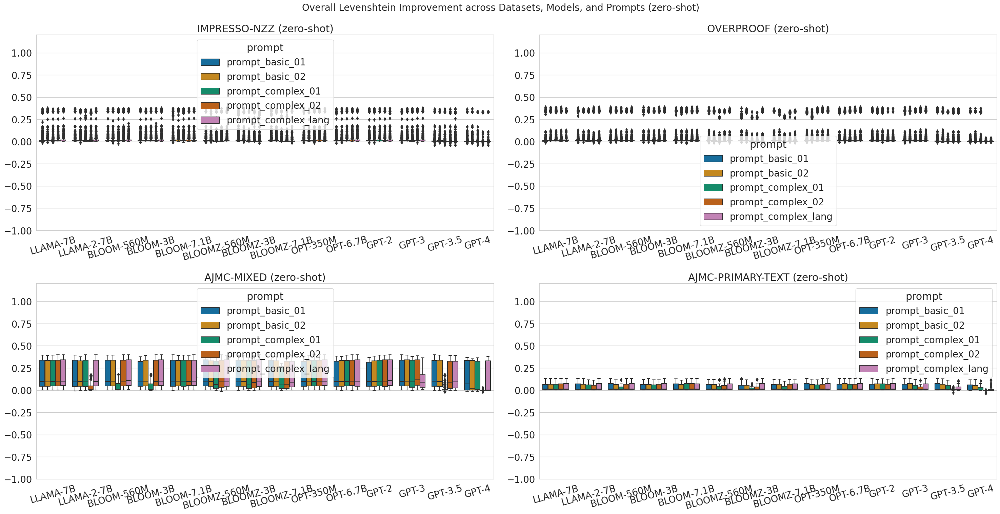

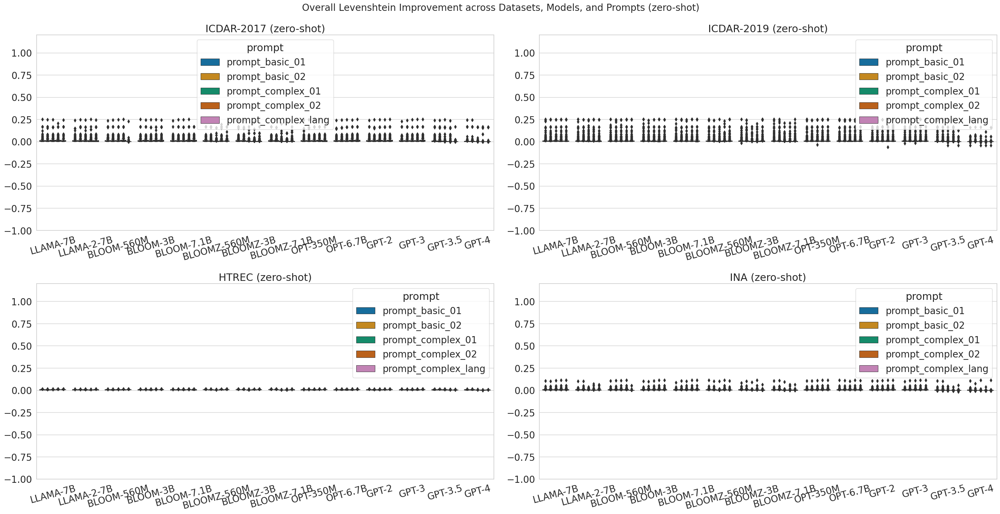

In [152]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import numpy as np
warnings.filterwarnings('ignore')

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1.8)
sns.set_style("whitegrid")

# Define OCR noise level bins
bins = [0, 0.4, 0.6, 0.8, 0.99, 1.0]

# Assign OCR noise level labels
labels = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]

# Count the number of unique datasets
n_datasets = data.dataset_name.nunique()
dataset_names = ['impresso-nzz', 'overproof', 'ajmc-mixed', 
                 'ajmc-primary-text', 'icdar-2017', 'icdar-2019', 'htrec', 'ina']

prompt_names = ['prompt_basic_01', 'prompt_basic_02', 'prompt_complex_01', 
                'prompt_complex_02', 'prompt_complex_lang']


n_plots = len(dataset_names)
n_plots_per_figure = 4
n_figures = int(np.ceil(n_plots / n_plots_per_figure))

print(n_figures)

# data = sample_data

for type_of_experiment in ['zero-shot']:
# for type_of_experiment in ['language-specific']:
    for error_rate in ['lev']:
        
        for fig_idx in range(n_figures):
            fig, axs = plt.subplots(2, 2, figsize=(30, 15))
            axs = axs.flatten()

            for i in range(n_plots_per_figure):
                idx = fig_idx * n_plots_per_figure + i
                if idx < n_plots:
                    dataset = dataset_names[idx]
                dataset_data = data[(data.dataset_name == dataset) & (data.type == type_of_experiment)]
                # Compute the mean WER across line, sentence, and region levels
                if 'icdar' not in dataset:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
                                                                      f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
                                                                  f'region-{error_rate}-improvement']].mean(axis=1)

                try:
                    # Plot the distribution of improvements for each model
                    _ = sns.boxplot(x='model', y=f'overall-levenshtein-improvement', data=dataset_data, 
                                    ax=axs[i], order=MODELS, hue='prompt', hue_order=prompt_names)
                    axs[i].set_title(f'{dataset.upper()} ({type_of_experiment})')
                    
                    
                    
                                # Plot the distribution of improvements for each model with color-coded points
#                     _ = sns.boxplot(x='model', y=f'overall-levenshtein-improvement', data=dataset_data, 
#                                     ax=axs[i], order=MODELS, hue='prompt', hue_order=prompt_names, 
#                                     palette='Blues' if type_of_experiment == 'zero-shot' else 'Reds')
#                     _ = sns.swarmplot(x='model', y=f'overall-levenshtein-improvement', data=dataset_data, 
#                                       ax=axs[i], order=MODELS, hue=f'sentence-lev-ocr', dodge=True, edgecolor='gray', linewidth=0.5)
#                     axs[i].set_title(f'{dataset.upper()} ({type_of_experiment})')
        

                    axs[i].set_ylim([-1, 1.2])
                    axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=15)  # Rotate x-axis labels
                    axs[i].set_xlabel('')  # Remove x-axis label
                    axs[i].set_ylabel('')  # Remove y-axis label
                    
                    
                    
                except Exception as ex:
                    print(f'Could not load {dataset} with {ex}')

            # Remove empty subplots
            for i in range(len(data.dataset_name.unique()), len(axs)):
                fig.delaxes(axs[i])

            plt.tight_layout()
            plt.suptitle(f'Overall Levenshtein Improvement across Datasets, Models, and Prompts ({type_of_experiment})', fontsize=20, y=1.02)
            plt.show()


In [67]:
data.columns

Index(['language', 'filename', 'dataset_name', 'ocr.line', 'ocr.sentence',
       'ocr.region', 'groundtruth.line', 'groundtruth.sentence',
       'groundtruth.region', 'prediction.prompt', 'prediction.sentence',
       'prediction.region', 'model', 'prompt', 'prompt_text', 'type', 'file',
       'length', 'sentence-lev-ocr', 'sentence-lev-pred',
       'sentence-lev-improvement', 'quality-band-sentence', 'region-lev-ocr',
       'region-lev-pred', 'region-lev-improvement', 'quality-band-region',
       'overall-levenshtein-improvement', 'improvement-band',
       'prediction.line', 'line-lev-ocr', 'line-lev-pred',
       'line-lev-improvement', 'quality-band-line', 'article_id', 'File',
       'Date', 'Type', 'NbAlignedChar', 'century', 'Access'],
      dtype='object')

In [70]:
dataset_data['sentence-lev-ocr']

0      1.000000
1      1.000000
2      1.000000
3      1.000000
4      1.000000
         ...   
831    1.000000
832    1.000000
833    1.000000
834    1.000000
835    0.969072
Name: sentence-lev-ocr, Length: 108699, dtype: float64

2


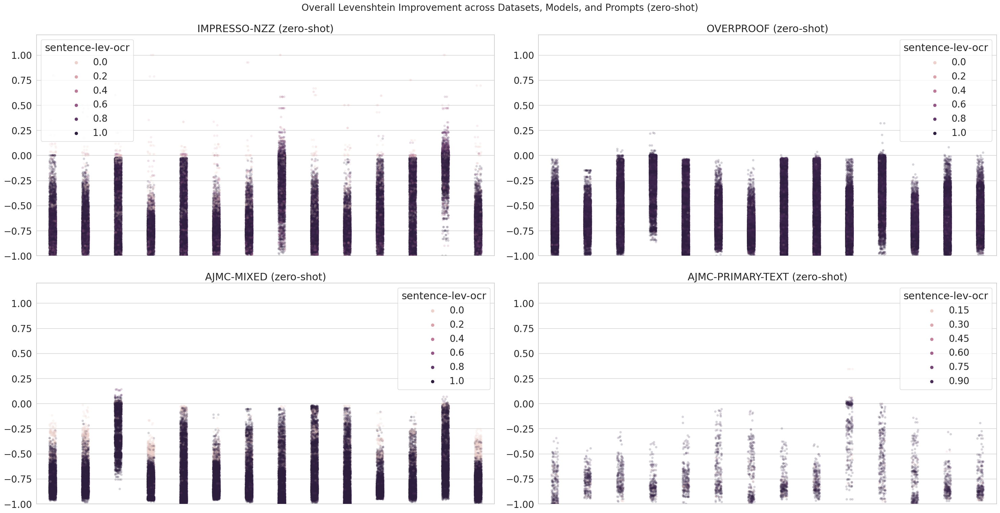

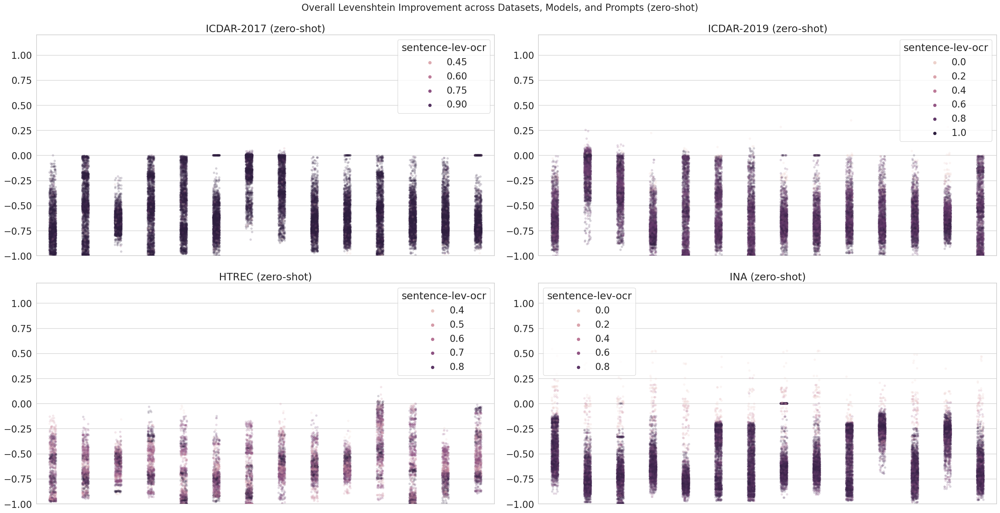

In [82]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import numpy as np
warnings.filterwarnings('ignore')

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1.8)
sns.set_style("whitegrid")
sns.set_palette(sns.color_palette("colorblind", desat=0.6))

# Define OCR noise level bins
bins = [0, 0.4, 0.6, 0.8, 0.99, 1.0]

# Assign OCR noise level labels
labels = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]

# Count the number of unique datasets
n_datasets = data.dataset_name.nunique()
dataset_names = ['impresso-nzz', 'overproof', 'ajmc-mixed', 
                 'ajmc-primary-text', 'icdar-2017', 'icdar-2019', 'htrec', 'ina']

prompt_names = ['prompt_basic_01', 'prompt_basic_02', 'prompt_complex_01', 
                'prompt_complex_02', 'prompt_complex_lang']


n_plots = len(dataset_names)
n_plots_per_figure = 4
n_figures = int(np.ceil(n_plots / n_plots_per_figure))

print(n_figures)

for type_of_experiment in ['zero-shot']:#, 'few-shot']:
# for type_of_experiment in ['language-specific']:
    for error_rate in ['lev']:
        
        for fig_idx in range(n_figures):
            fig, axs = plt.subplots(2, 2, figsize=(30, 15))
            axs = axs.flatten()

            for i in range(n_plots_per_figure):
                idx = fig_idx * n_plots_per_figure + i
                if idx < n_plots:
                    dataset = dataset_names[idx]
                dataset_data = data[(data.dataset_name == dataset) & (data.type == type_of_experiment)]
                # Compute the mean WER across line, sentence, and region levels
#                 if 'icdar' not in dataset:
#                     dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
#                                                                       f'sentence-{error_rate}-improvement', 
#                                                                       f'region-{error_rate}-improvement']].mean(axis=1)
#                 else:
#                     dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
#                                                                   f'region-{error_rate}-improvement']].mean(axis=1)

                try:
                    # Plot the distribution of improvements for each model
#                     _ = sns.boxplot(x='model', y=f'sentence-lev-improvement', data=dataset_data, 
#                                     ax=axs[i], order=MODELS, hue='prompt', hue_order=prompt_names)
#                     axs[i].set_title(f'{dataset.upper()} ({type_of_experiment})')
                    
#                     # Calculate the percentage of correct OCR for this dataset
#                     correct_ocr_percentage = (dataset_data['sentence-lev-ocr'] == 1.0).mean() * 100

#                     # Add text annotation to the subplot
#                     annotation_text = f"Correct OCR: {correct_ocr_percentage:.2f}%"
#                     axs[i].annotate(annotation_text, xy=(0.05, 0.95), xycoords='axes fraction', 
#                                     fontsize=12, color='Red', va='top', ha='center')
            
                    
#                    # Plot the distribution of improvements for each model with color-coded points
#                     _ = sns.boxplot(x='model', y=f'sentence-lev-improvement', data=dataset_data, 
#                                     ax=axs[i], order=MODELS, hue='prompt', hue_order=prompt_names, 
#                                     palette='Blues' if type_of_experiment == 'zero-shot' else 'Reds')
#                     _ = sns.swarmplot(x='model', y=f'sentence-lev-improvement', data=dataset_data, 
#                                       ax=axs[i], order=MODELS, hue=f'sentence-lev-ocr', dodge=True, edgecolor='gray', linewidth=0.5)
                    _ = sns.stripplot(x='model', y=f'overall-levenshtein-improvement', hue=f'sentence-lev-ocr',
                                      data=dataset_data, jitter=True, alpha=0.2, ax=axs[i], size=5)

#                     print(f'{dataset.upper()} ({type_of_experiment})')
                    axs[i].set_title(f'{dataset.upper()} ({type_of_experiment})')
        
                    axs[i].set_ylim([-1, 1.2])
                    axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=15)  # Rotate x-axis labels
                    axs[i].set_xlabel('')  # Remove x-axis label
                    axs[i].set_ylabel('')  # Remove y-axis label
                    
                except Exception as ex:
                    print(f'Could not load {dataset} with {ex}')

            # Remove empty subplots
            for i in range(len(data.dataset_name.unique()), len(axs)):
                fig.delaxes(axs[i])

            plt.tight_layout()
            plt.suptitle(f'Overall Levenshtein Improvement across Datasets, Models, and Prompts ({type_of_experiment})', fontsize=20, y=1.02)
            plt.show()


2


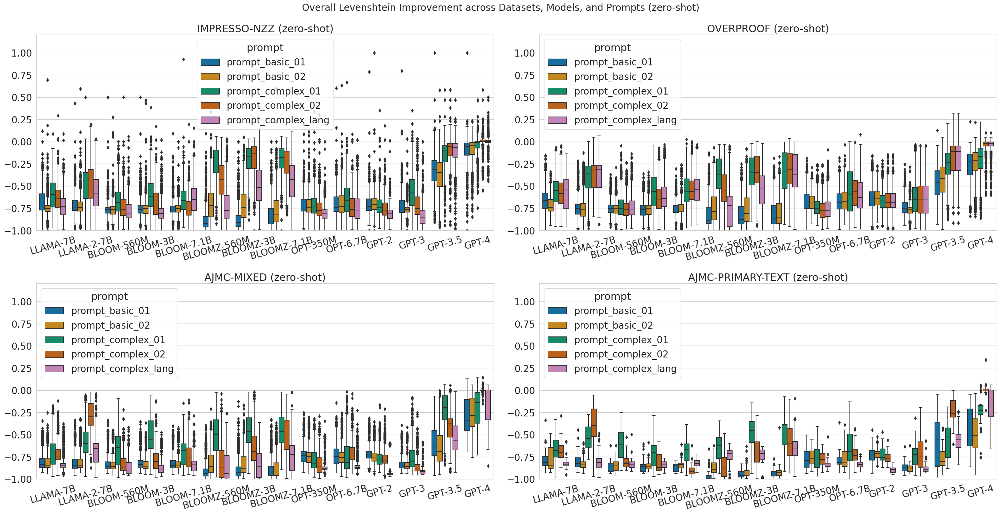

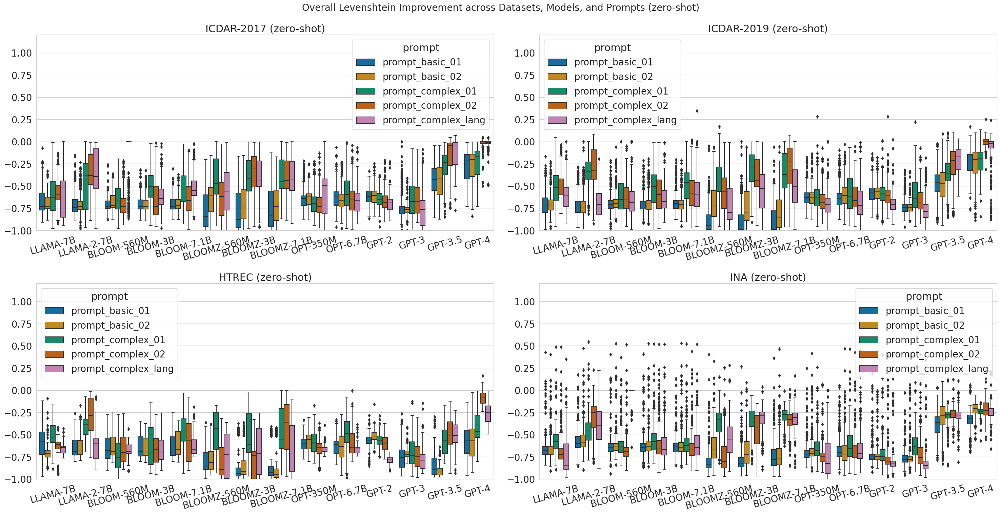

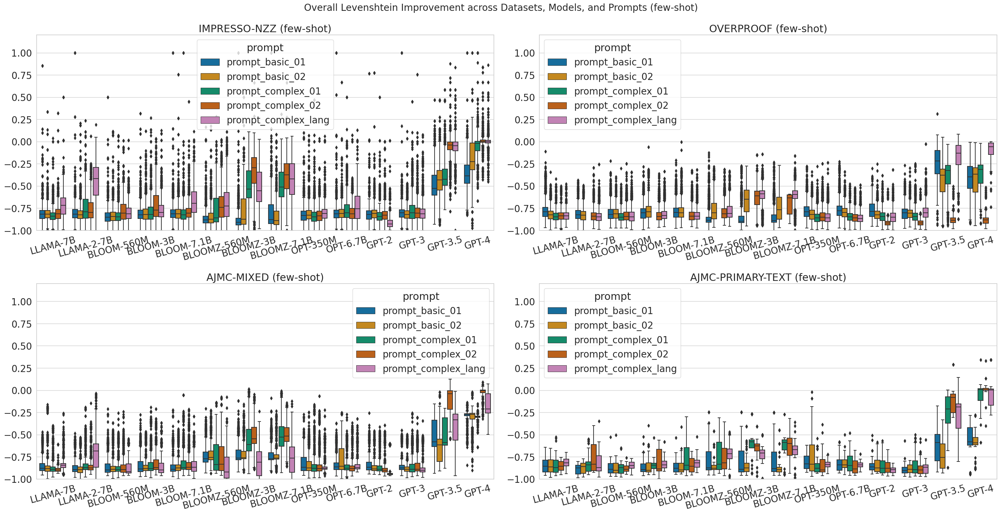

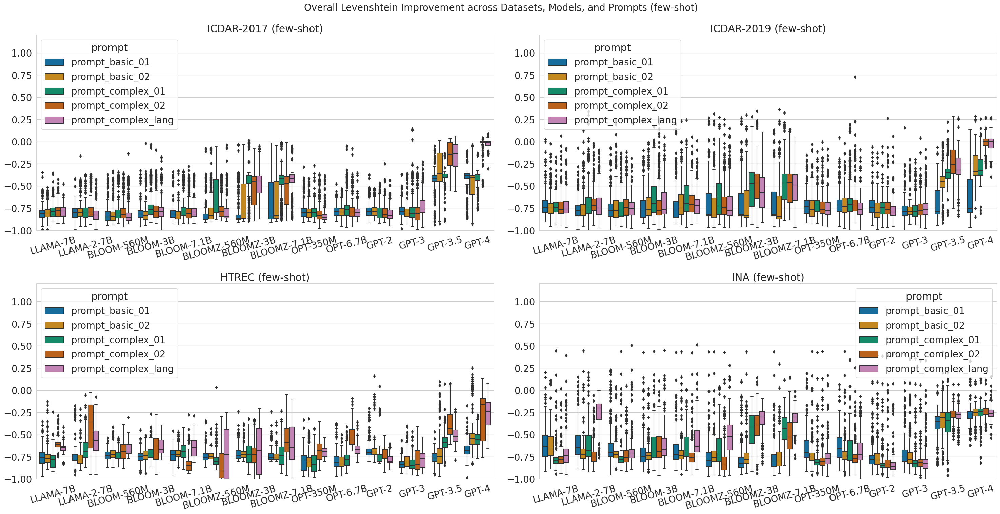

In [61]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import numpy as np
warnings.filterwarnings('ignore')

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1.8)
sns.set_style("whitegrid")

# Define OCR noise level bins
bins = [0, 0.4, 0.6, 0.8, 0.99, 1.0]

# Assign OCR noise level labels
labels = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]

# Count the number of unique datasets
n_datasets = data.dataset_name.nunique()
dataset_names = ['impresso-nzz', 'overproof', 'ajmc-mixed', 
                 'ajmc-primary-text', 'icdar-2017', 'icdar-2019', 'htrec', 'ina']

prompt_names = ['prompt_basic_01', 'prompt_basic_02', 'prompt_complex_01', 
                'prompt_complex_02', 'prompt_complex_lang']


n_plots = len(dataset_names)
n_plots_per_figure = 4
n_figures = int(np.ceil(n_plots / n_plots_per_figure))

print(n_figures)

for type_of_experiment in ['zero-shot', 'few-shot']:
# for type_of_experiment in ['language-specific']:
    for error_rate in ['lev']:
        
        for fig_idx in range(n_figures):
            fig, axs = plt.subplots(2, 2, figsize=(30, 15))
            axs = axs.flatten()

            for i in range(n_plots_per_figure):
                idx = fig_idx * n_plots_per_figure + i
                if idx < n_plots:
                    dataset = dataset_names[idx]
                dataset_data = data[(data.dataset_name == dataset) & (data.type == type_of_experiment)]
                # Compute the mean WER across line, sentence, and region levels
                if 'icdar' not in dataset:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
                                                                      f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
                                                                  f'region-{error_rate}-improvement']].mean(axis=1)

                try:
                    # Plot the distribution of improvements for each model
                    _ = sns.boxplot(x='model', y=f'overall-levenshtein-improvement', data=dataset_data, 
                                    ax=axs[i], order=MODELS, hue='prompt', hue_order=prompt_names)
                    axs[i].set_title(f'{dataset.upper()} ({type_of_experiment})')

                    axs[i].set_ylim([-1, 1.2])
                    axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=15)  # Rotate x-axis labels
                    axs[i].set_xlabel('')  # Remove x-axis label
                    axs[i].set_ylabel('')  # Remove y-axis label
                except Exception as ex:
                    print(f'Could not load {dataset} with {ex}')

            # Remove empty subplots
            for i in range(len(data.dataset_name.unique()), len(axs)):
                fig.delaxes(axs[i])

            plt.tight_layout()
            plt.suptitle(f'Overall Levenshtein Improvement across Datasets, Models, and Prompts ({type_of_experiment})', fontsize=20, y=1.02)
            plt.show()


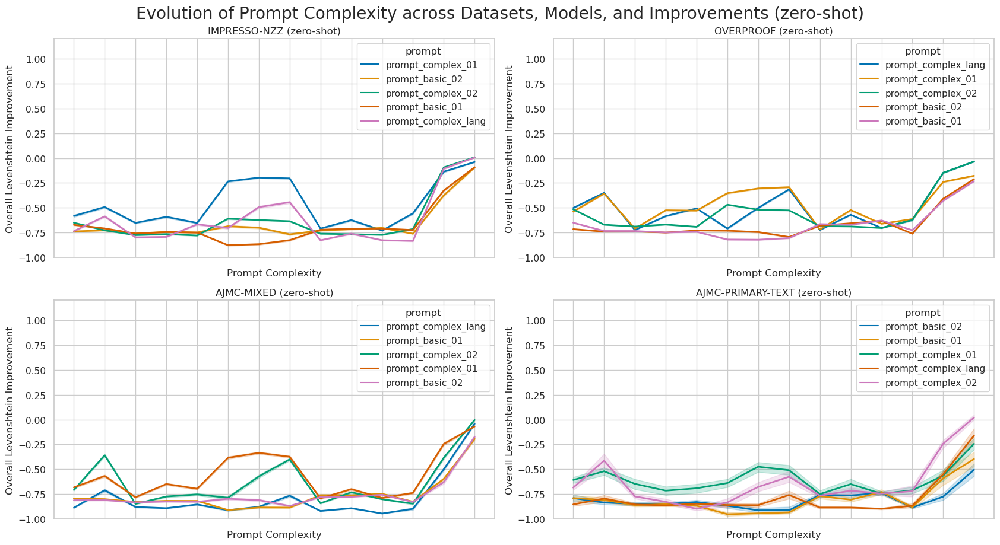

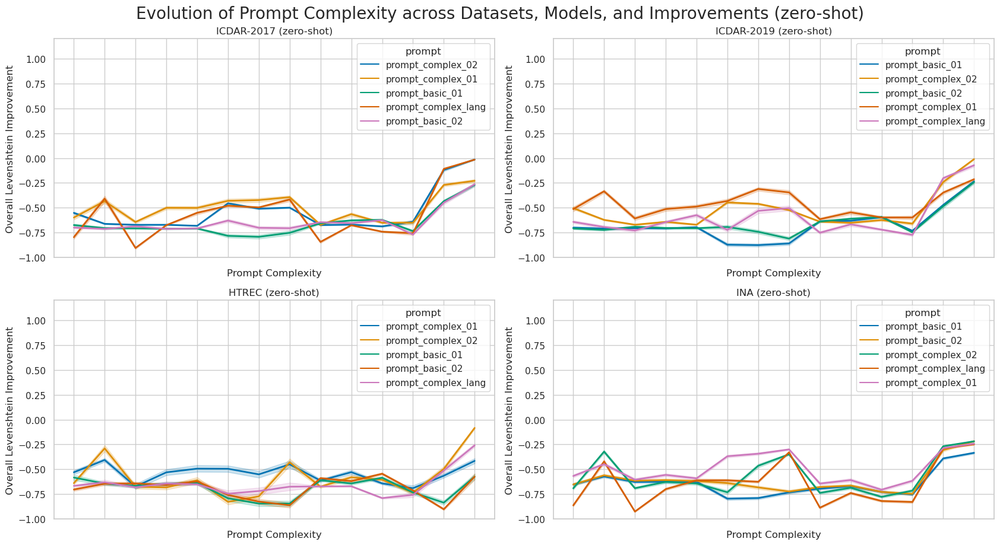

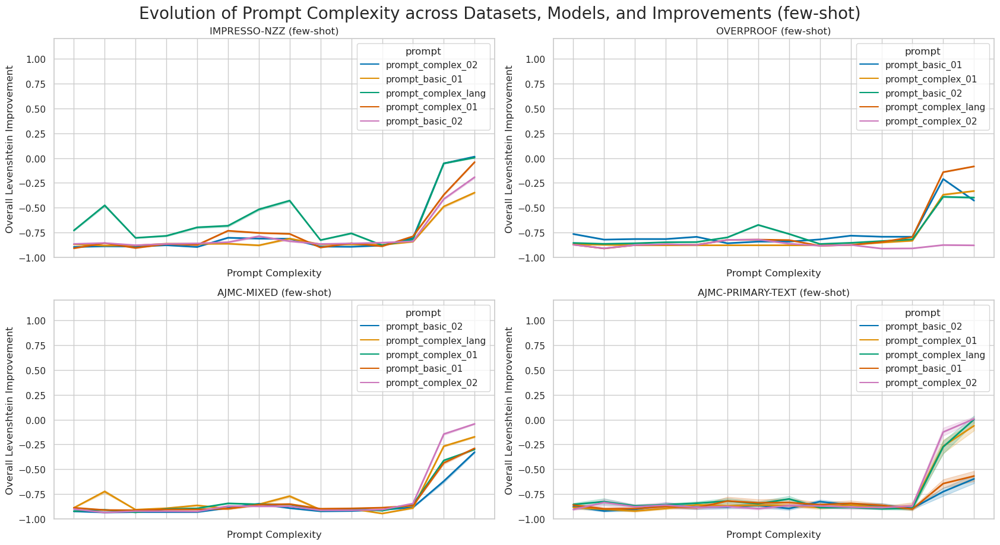

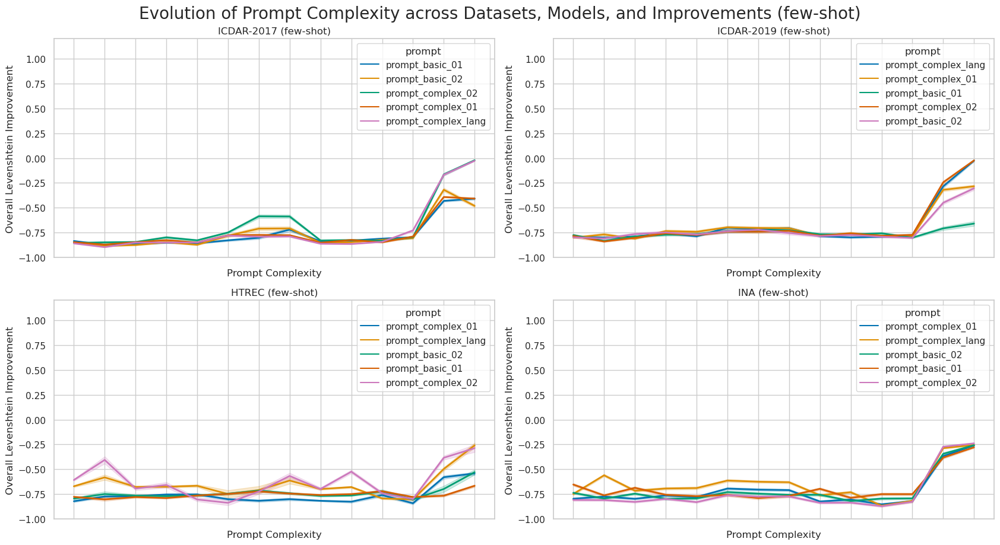

In [86]:
sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1.)
sns.set_style("whitegrid")

prompt_names = ['prompt_basic_01', 'prompt_basic_02', 'prompt_complex_01', 
                'prompt_complex_02', 'prompt_complex_lang']


for type_of_experiment in ['zero-shot', 'few-shot']:#
    for error_rate in ['lev']:
        for fig_idx in range(n_figures):
            fig, axs = plt.subplots(2, 2, figsize=(17, 9))
            axs = axs.flatten()

            for i in range(n_plots_per_figure):
                idx = fig_idx * n_plots_per_figure + i
                if idx < n_plots:
                    dataset = dataset_names[idx]
                    
                dataset_data = data[(data.dataset_name == dataset) & (data.type == type_of_experiment)]
                
                dataset_data['model'] = pd.Categorical(dataset_data['model'], categories=MODELS, ordered=True)
                
                if 'icdar' not in dataset:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
                                                                      f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
                                                                  f'region-{error_rate}-improvement']].mean(axis=1)

                try:
                    # Plot the line plot of improvements for each model
                    _ = sns.lineplot(x='model', y=f'overall-levenshtein-improvement', 
                                     data=dataset_data.sort_values('model'), 
                                    ax=axs[i], hue='prompt', sort=False, linewidth=2)
                    axs[i].set_title(f'{dataset.upper()} ({type_of_experiment})')
                    axs[i].set_ylim([-1, 1.2])
                    axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=15)
                    axs[i].set_xlabel('Prompt Complexity')  
                    axs[i].set_ylabel('Overall Levenshtein Improvement')  
                except Exception as ex:
                    print(f'Could not load {dataset} with {ex}')

            # Remove empty subplots
            for i in range(len(data.dataset_name.unique()), len(axs)):
                fig.delaxes(axs[i])

            plt.tight_layout()
            plt.suptitle(f'Evolution of Prompt Complexity across Datasets, Models, and Improvements ({type_of_experiment})', fontsize=20, y=1.02)
            plt.show()


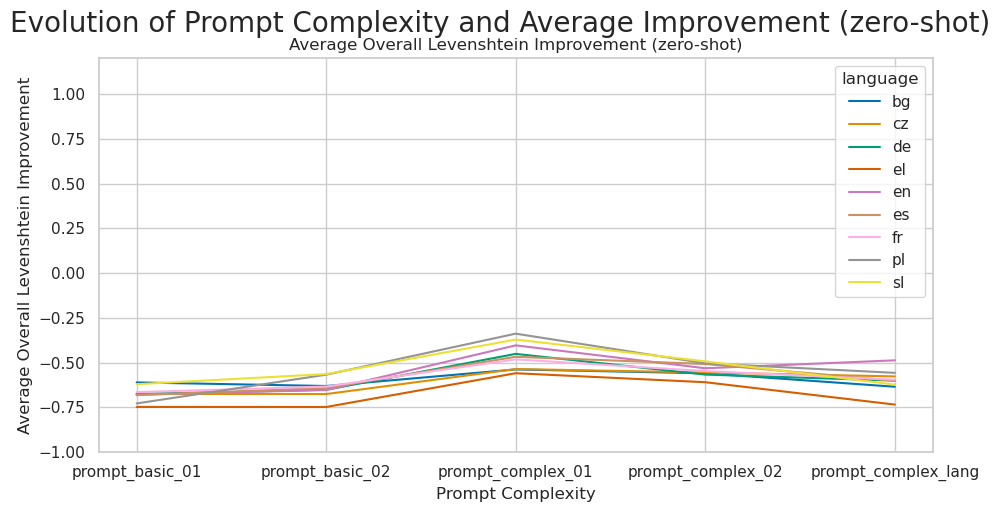

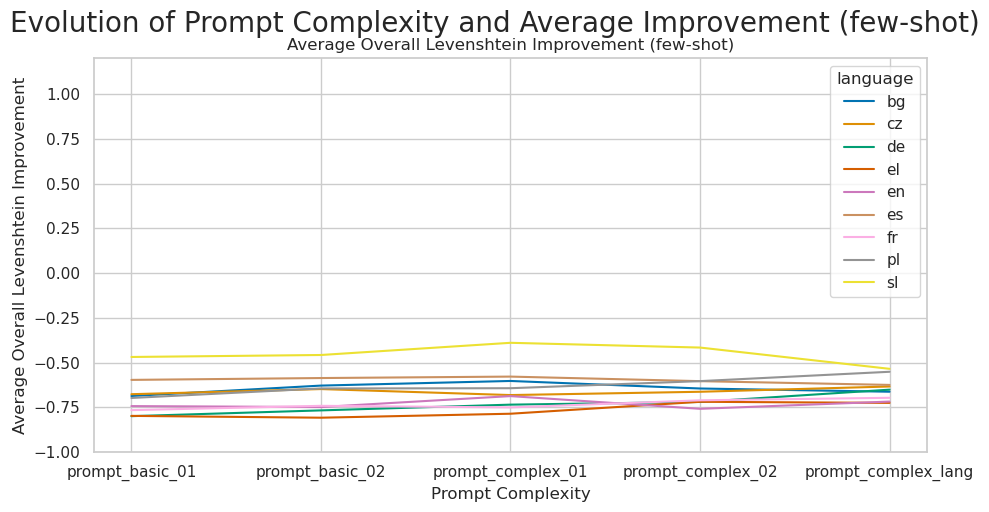

In [87]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import numpy as np
warnings.filterwarnings('ignore')

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1)
sns.set_style("whitegrid")

for type_of_experiment in ['zero-shot', 'few-shot']:
    for error_rate in ['lev']:
        # Create a new DataFrame to store the average improvements for each language and prompt
        average_improvements = pd.DataFrame(columns=['prompt', 'language', 'overall-levenshtein-improvement'])

        for language in data.language.unique():  # Iterate over each unique language
            for dataset in dataset_names:
                dataset_data = data[(data.dataset_name == dataset) & (data.language == language) & (data.type == type_of_experiment)]  # Filter data for the current language
                if 'icdar' not in dataset:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
                                                                          f'sentence-{error_rate}-improvement', 
                                                                          f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data[f'overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)

                # Group the data by prompt and language, then calculate the mean Overall Levenshtein Improvement
                grouped_data = dataset_data.groupby(['prompt', 'language'])[f'overall-levenshtein-improvement'].mean().reset_index()

                # Add the grouped data to the average_improvements DataFrame
                average_improvements = pd.concat([average_improvements, grouped_data])

        # Group the data by prompt and language again, this time averaging the averages for each language and prompt
        average_improvements = average_improvements.groupby(['prompt', 'language'])[f'overall-levenshtein-improvement'].mean().reset_index()

        fig, ax = plt.subplots(figsize=(10, 5))  # Create the plot

        try:
            # Plot the line plot of average improvements for each prompt
            _ = sns.lineplot(x='prompt', y=f'overall-levenshtein-improvement', hue='language', data=average_improvements, 
                             ax=ax, legend='full')  # Add hue='language' to differentiate lines by language
        except Exception as ex:
            print(f'Could not load data with {ex}')

        ax.set_title(f'Average Overall Levenshtein Improvement ({type_of_experiment})')  # Modify title since it's no longer specific to one language
        ax.set_ylim([-1, 1.2])
        ax.set_xlabel('Prompt Complexity')  
        ax.set_ylabel('Average Overall Levenshtein Improvement')

        plt.tight_layout()
        plt.suptitle(f'Evolution of Prompt Complexity and Average Improvement ({type_of_experiment})', fontsize=20, y=1.02)
        plt.show()



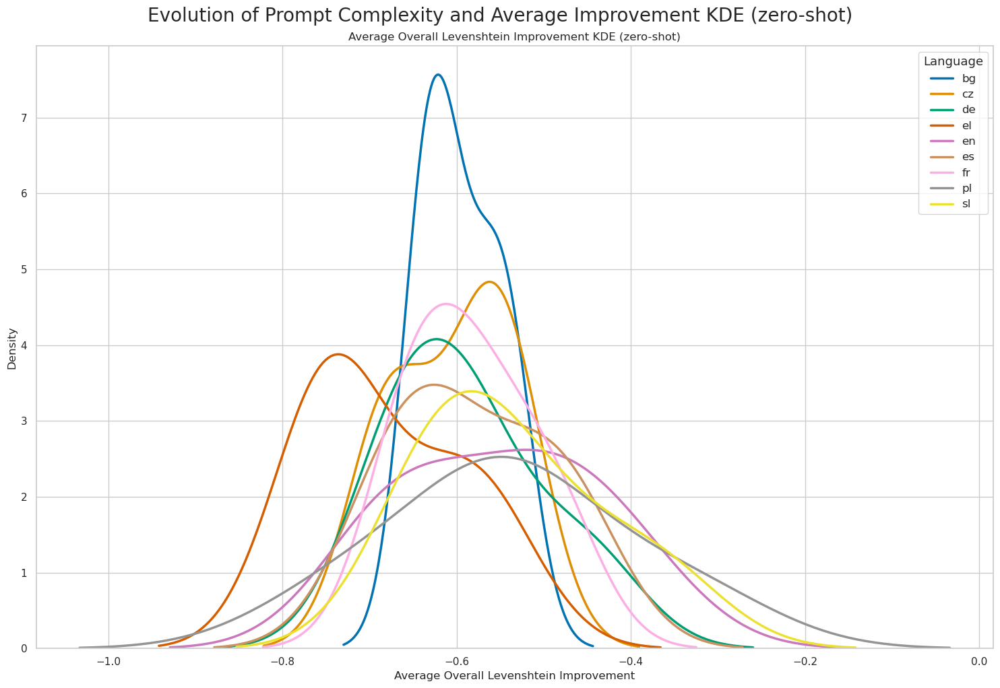

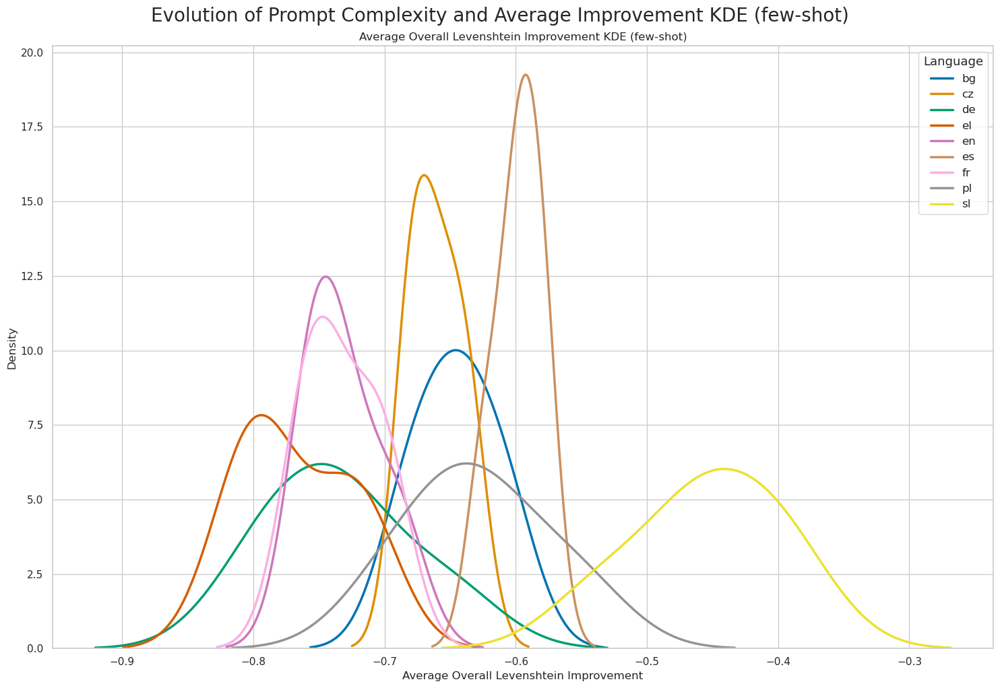

In [89]:
for type_of_experiment in ['zero-shot', 'few-shot']:
    for error_rate in ['lev']:
        # Create a new DataFrame to store the average improvements for each language and prompt
        average_improvements = pd.DataFrame(columns=['prompt', 'language', 'overall-levenshtein-improvement'])

        for language in data.language.unique():  # Iterate over each unique language
            for dataset in dataset_names:
                dataset_data = data[(data.dataset_name == dataset) & (data.language == language) & (data.type == type_of_experiment)]  # Filter data for the current language
                if 'icdar' not in dataset:
                    dataset_data['overall-levenshtein-improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
                                                                          f'sentence-{error_rate}-improvement', 
                                                                          f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data['overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)

                # Group the data by prompt and language, then calculate the mean Overall Levenshtein Improvement
                grouped_data = dataset_data.groupby(['prompt', 'language'])['overall-levenshtein-improvement'].mean().reset_index()

                # Add the grouped data to the average_improvements DataFrame
                average_improvements = pd.concat([average_improvements, grouped_data])

        # Group the data by prompt and language again, this time averaging the averages for each language and prompt
        average_improvements = average_improvements.groupby(['prompt', 'language'])['overall-levenshtein-improvement'].mean().reset_index()

        fig, ax = plt.subplots(figsize=(15, 10))  # Create the plot

        try:
            # Plot the KDE plot of average improvements for each prompt
            for language in average_improvements.language.unique():
                _ = sns.kdeplot(average_improvements[average_improvements.language == language]['overall-levenshtein-improvement'], 
                                ax=ax, label=language, lw=2.5)  # Increase line width here
        except Exception as ex:
            print(f'Could not load data with {ex}')

        ax.set_title(f'Average Overall Levenshtein Improvement KDE ({type_of_experiment})')  # Modify title since it's no longer specific to one language
        ax.set_xlabel('Average Overall Levenshtein Improvement')
        ax.set_ylabel('Density')

        plt.tight_layout()
        plt.legend(title='Language', title_fontsize='13', fontsize='12')  # Increase legend fontsize here
        plt.suptitle(f'Evolution of Prompt Complexity and Average Improvement KDE ({type_of_experiment})', fontsize=20, y=1.02)
        plt.show()


In [ ]:
data.columns

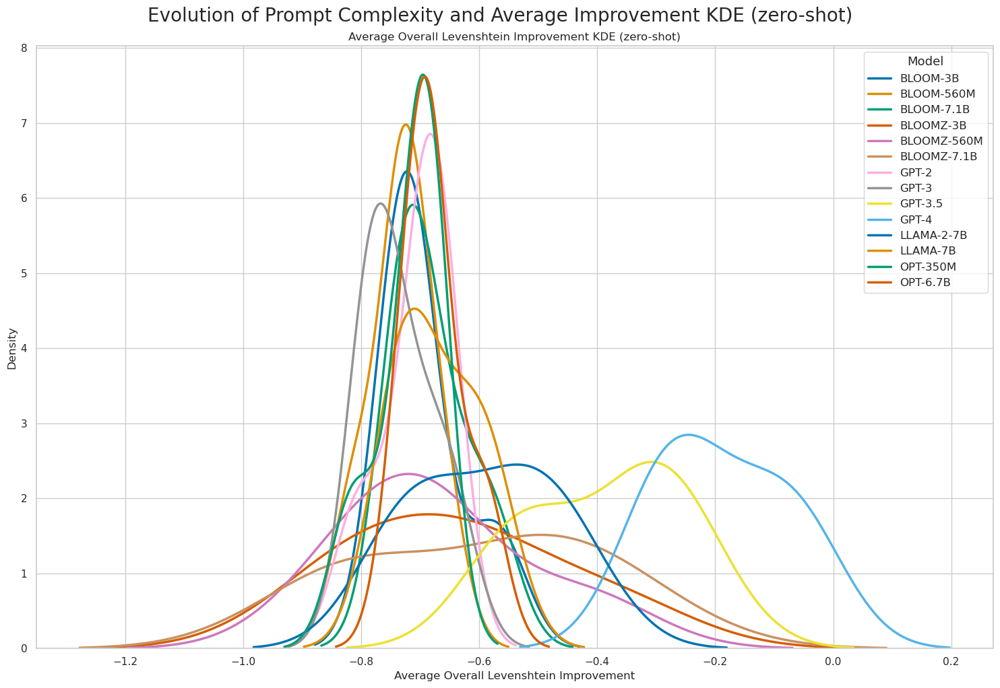

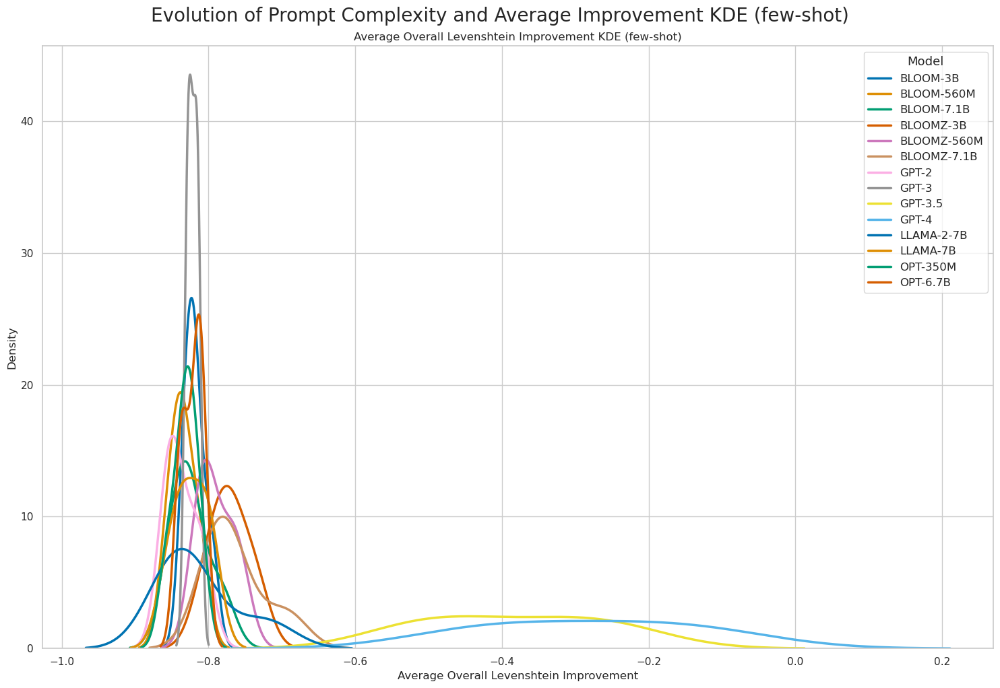

In [90]:
for type_of_experiment in ['zero-shot', 'few-shot']:
    for error_rate in ['lev']:
        # Create a new DataFrame to store the average improvements for each model and prompt
        average_improvements = pd.DataFrame(columns=['prompt', 'model', 'overall-levenshtein-improvement'])

        for model in data.model.unique():  # Iterate over each unique model
            for dataset in dataset_names:
                dataset_data = data[(data.dataset_name == dataset) & (data.model == model) & (data.type == type_of_experiment)]  # Filter data for the current model
                if 'icdar' not in dataset:
                    dataset_data[f'Overall Levenshtein Improvement'] = dataset_data[[f'line-{error_rate}-improvement', 
                                                                          f'sentence-{error_rate}-improvement', 
                                                                          f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data[f'Overall Levenshtein Improvement'] = dataset_data[[f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)

                # Group the data by prompt and model, then calculate the mean Overall Levenshtein Improvement
                grouped_data = dataset_data.groupby(['prompt', 'model'])['overall-levenshtein-improvement'].mean().reset_index()

                # Add the grouped data to the average_improvements DataFrame
                average_improvements = pd.concat([average_improvements, grouped_data])

        # Group the data by prompt and model again, this time averaging the averages for each model and prompt
        average_improvements = average_improvements.groupby(['prompt', 'model'])['overall-levenshtein-improvement'].mean().reset_index()

        fig, ax = plt.subplots(figsize=(15, 10))  # Create the plot

        try:
            # Plot the KDE plot of average improvements for each prompt
            for model in average_improvements.model.unique():
                _ = sns.kdeplot(average_improvements[average_improvements.model == model]['overall-levenshtein-improvement'], 
                                ax=ax, label=model, lw=2.5)  # Increase line width here
        except Exception as ex:
            print(f'Could not load data with {ex}')

        ax.set_title(f'Average Overall Levenshtein Improvement KDE ({type_of_experiment})')  # Modify title since it's no longer specific to one model
        ax.set_xlabel('Average Overall Levenshtein Improvement')
        ax.set_ylabel('Density')

        plt.tight_layout()
        plt.legend(title='Model', title_fontsize='13', fontsize='12')  # Increase legend fontsize here
        plt.suptitle(f'Evolution of Prompt Complexity and Average Improvement KDE ({type_of_experiment})', fontsize=20, y=1.02)
        plt.show()


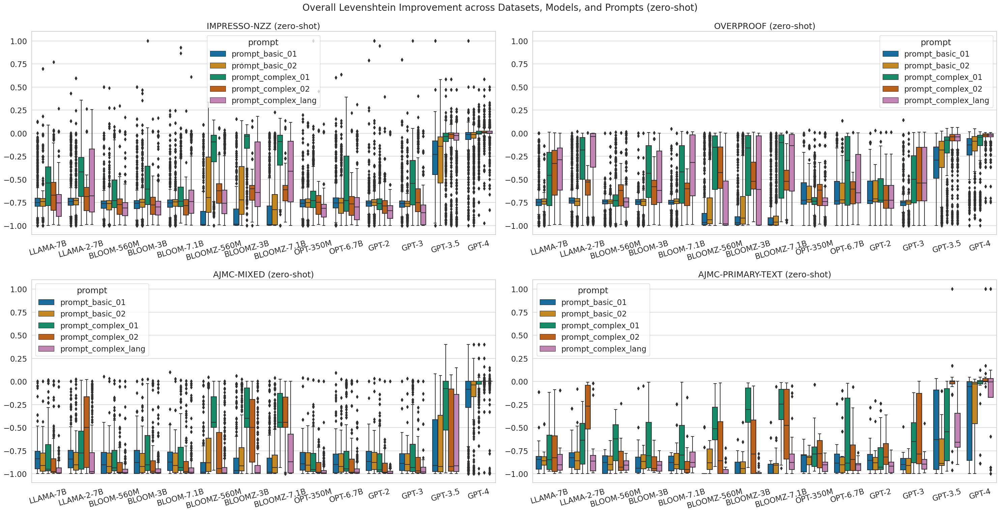

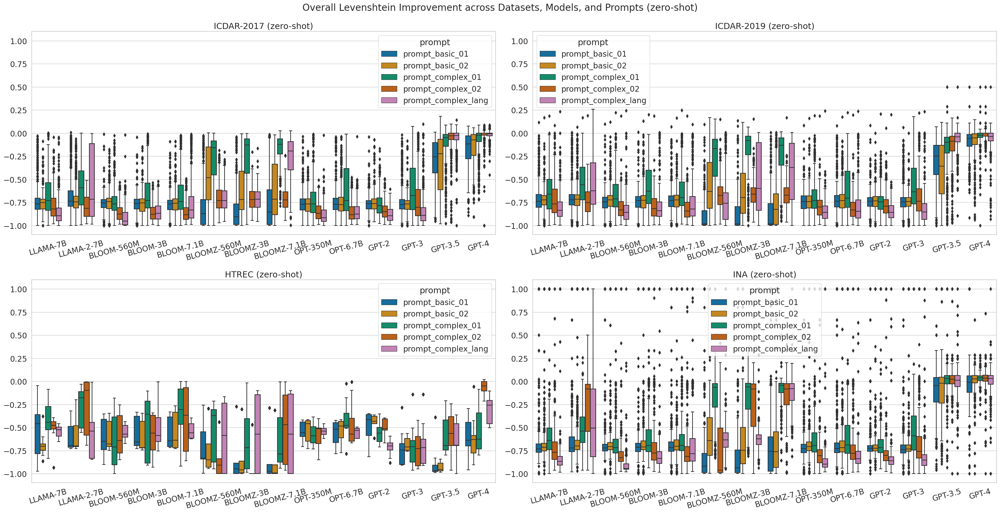

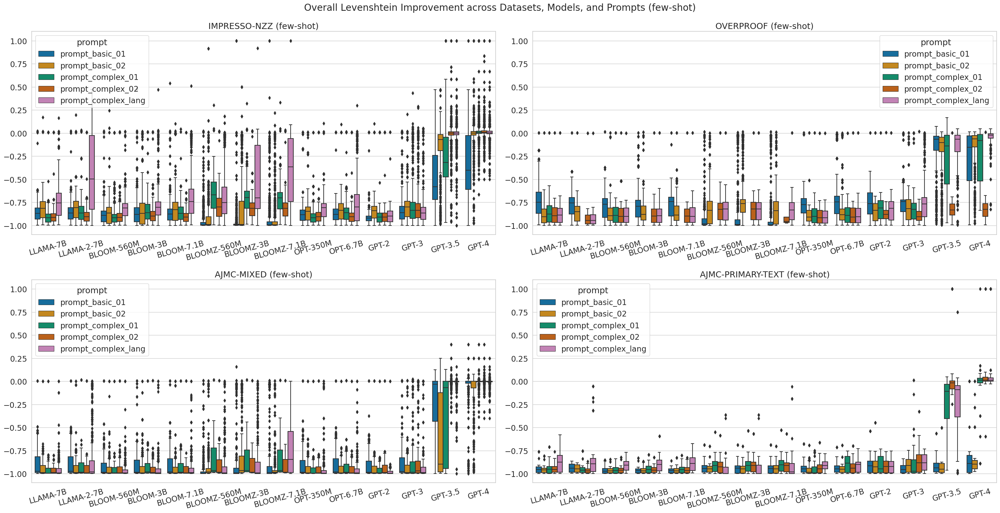

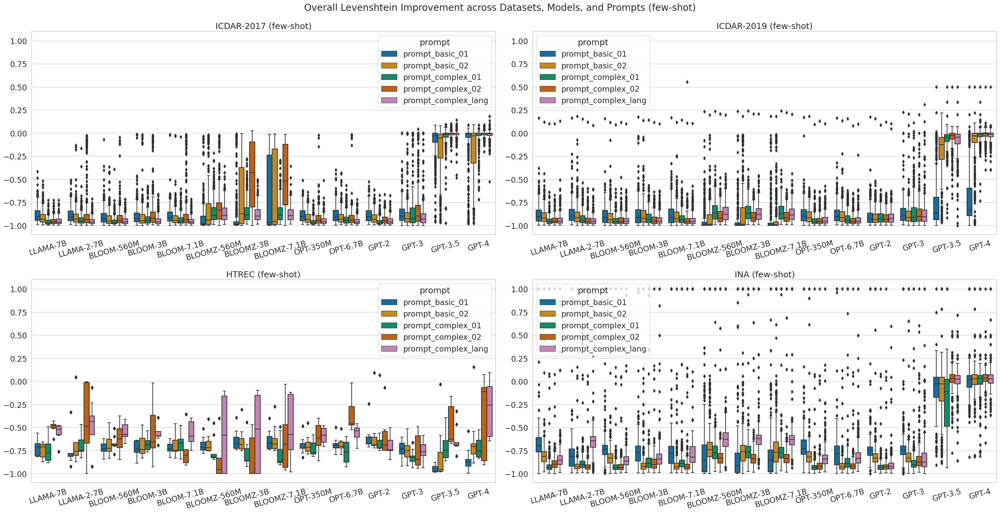

In [91]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import warnings
import numpy as np
warnings.filterwarnings('ignore')

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1.5)
sns.set_style("whitegrid")

# Define OCR noise level bins
bins = [0, 0.4, 0.6, 0.8, 0.99, 1.0]

# Assign OCR noise level labels
labels = ["0-40%", "40-60%", "60-80%", "80-99%", "99-100%"]

# Count the number of unique datasets
n_datasets = data.dataset_name.nunique()
dataset_names = ['impresso-nzz', 'overproof', 'ajmc-mixed', 
                 'ajmc-primary-text', 'icdar-2017', 'icdar-2019', 'htrec', 'ina']

prompt_names = ['prompt_basic_01', 'prompt_basic_02', 'prompt_complex_01', 
                'prompt_complex_02', 'prompt_complex_lang']


n_plots = len(dataset_names)
n_plots_per_figure = 4
n_figures = int(np.ceil(n_plots / n_plots_per_figure))

for type_of_experiment in ['zero-shot', 'few-shot']:
# for type_of_experiment in ['language-specific']:
    for error_rate in ['lev']:
        
        for fig_idx in range(n_figures):
            fig, axs = plt.subplots(2, 2, figsize=(30, 15))
            axs = axs.flatten()

            for i in range(n_plots_per_figure):
                idx = fig_idx * n_plots_per_figure + i
                if idx < n_plots:
                    dataset = dataset_names[idx]
                dataset_data = data[(data.dataset_name == dataset) & (data.type == type_of_experiment)]
                # Compute the mean WER across line, sentence, and region levels
                if 'icdar' not in dataset:
                    dataset_data['overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement']].mean(axis=1)
                else:
                    dataset_data['overall-levenshtein-improvement'] = dataset_data[[f'sentence-{error_rate}-improvement']].mean(axis=1)

                try:
                    # Plot the distribution of improvements for each model
                    _ = sns.boxplot(x='model', y='overall-levenshtein-improvement', data=dataset_data, 
                                    ax=axs[i], order=MODELS, hue='prompt', hue_order=prompt_names)
                    axs[i].set_title(f'{dataset.upper()} ({type_of_experiment})')

                    axs[i].set_ylim([-1.1, 1.1])
                    axs[i].set_xticklabels(axs[i].get_xticklabels(), rotation=15)  # Rotate x-axis labels
                    axs[i].set_xlabel('')  # Remove x-axis label
                    axs[i].set_ylabel('')  # Remove y-axis label
                except Exception as ex:
                    print(f'Could not load {dataset} with {ex}')


            # Remove empty subplots
            for i in range(len(data.dataset_name.unique()), len(axs)):
                fig.delaxes(axs[i])

            plt.tight_layout()
            plt.suptitle(f'Overall Levenshtein Improvement across Datasets, Models, and Prompts ({type_of_experiment})', fontsize=20, y=1.02)
            plt.show()


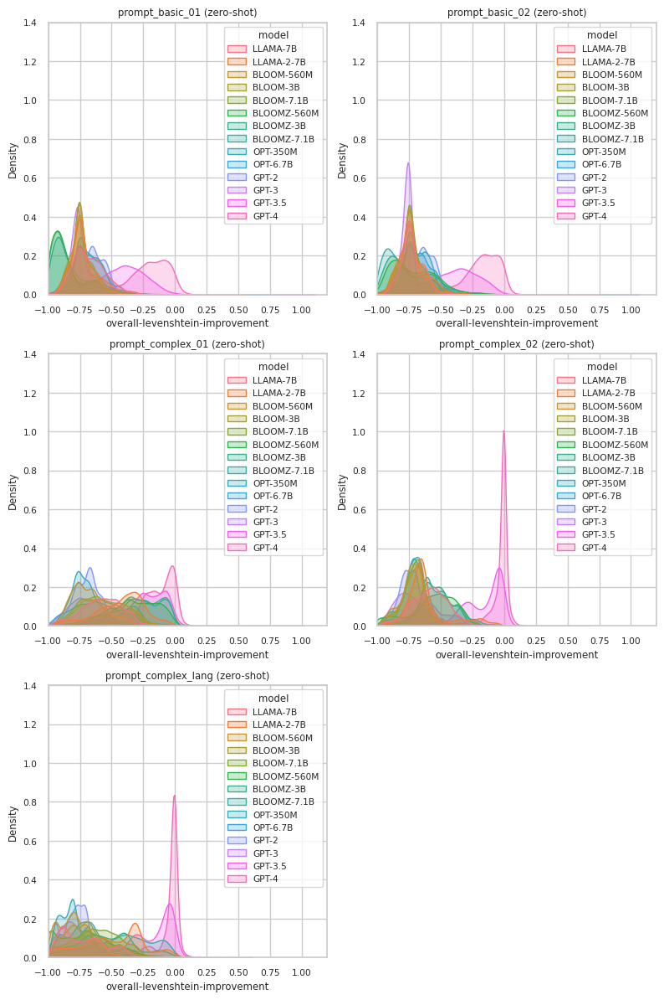

In [93]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=.7)
sns.set_style("whitegrid")

for type_of_experiment in ['zero-shot']:
    for error_rate in ['lev']:
        fig, axs = plt.subplots(3, 2, figsize=(8, 12))  # Change here
        axs = axs.flatten()  # To make it easy to index

        for i, prompt in enumerate(prompt_names):
            prompt_data = data[(data.prompt == prompt) & (data.type == type_of_experiment)]
            
            if 'icdar' not in dataset:
                prompt_data['overall-levenshtein-improvement'] = prompt_data[[f'line-{error_rate}-improvement', 
                                                                  f'sentence-{error_rate}-improvement', 
                                                                  f'region-{error_rate}-improvement']].mean(axis=1)
            else:
                prompt_data['overall-levenshtein-improvement'] = prompt_data[[f'sentence-{error_rate}-improvement', 
                                                              f'region-{error_rate}-improvement']].mean(axis=1)

            try:
                if len(prompt_data) > 0:
                    sns.kdeplot(data=prompt_data, x='overall-levenshtein-improvement', hue='model', 
                                fill=True, ax=axs[i], hue_order=MODELS)
                    axs[i].set_title(f'{prompt} ({type_of_experiment})')
                    axs[i].set_xlim([-1, 1.2])
                    axs[i].set_ylim([0, 1.4])
            except Exception as ex:
                print(f'Could not plot {prompt} with {ex}')

        # Remove empty subplot
        fig.delaxes(axs[-1])  # Change here

        plt.tight_layout()
        plt.show()
        
# A kernel density estimate (KDE) plot is a method for visualizing the distribution of observations in a dataset, 
# analogous to a histogram. KDE represents the data using a continuous probability density curve in one or more 
# dimensions.

# Relative to a histogram, KDE can produce a plot that is less cluttered and more interpretable, especially when 
# drawing multiple distributions. But it has the potential to introduce distortions if the underlying distribution 
# is bounded or not smooth. Like a histogram, the quality of the representation also depends on the selection of 
# good smoothing parameters.


In [ ]:
data.columns

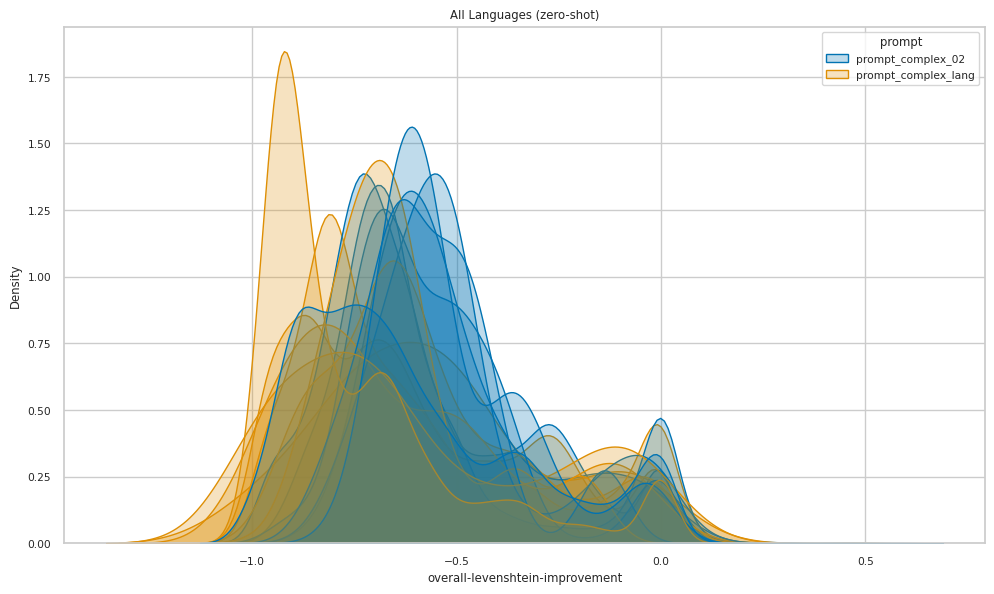

In [94]:
prompts_to_compare = ['prompt_complex_02', 'prompt_complex_lang']
languages = [lang for lang in data['language'].unique() if lang != 'en']  # Exclude 'en' language

for type_of_experiment in ['zero-shot']:
    for error_rate in ['lev']:
        plt.figure(figsize=(10, 6))  # Adjust as necessary

        for language in languages:
            language_data = data[(data.language == language) & 
                                 (data.type == type_of_experiment) & 
                                 (data.prompt.isin(prompts_to_compare))]

            if 'icdar' not in dataset:
                language_data['overall-levenshtein-improvement'] = language_data[[f'line-{error_rate}-improvement', 
                                                                  f'sentence-{error_rate}-improvement', 
                                                                  f'region-{error_rate}-improvement']].mean(axis=1)
            else:
                language_data['overall-levenshtein-improvement'] = language_data[[f'sentence-{error_rate}-improvement', 
                                                              f'region-{error_rate}-improvement']].mean(axis=1)

            try:
                if len(language_data) > 0:
                    sns.kdeplot(data=language_data, x='overall-levenshtein-improvement', hue='prompt', 
                                fill=True, hue_order=prompts_to_compare)
            except Exception as ex:
                print(f'Could not plot {language} with {ex}')

        plt.title(f'All Languages ({type_of_experiment})')
        plt.tight_layout()
        plt.show()


In [ ]:
data.columns

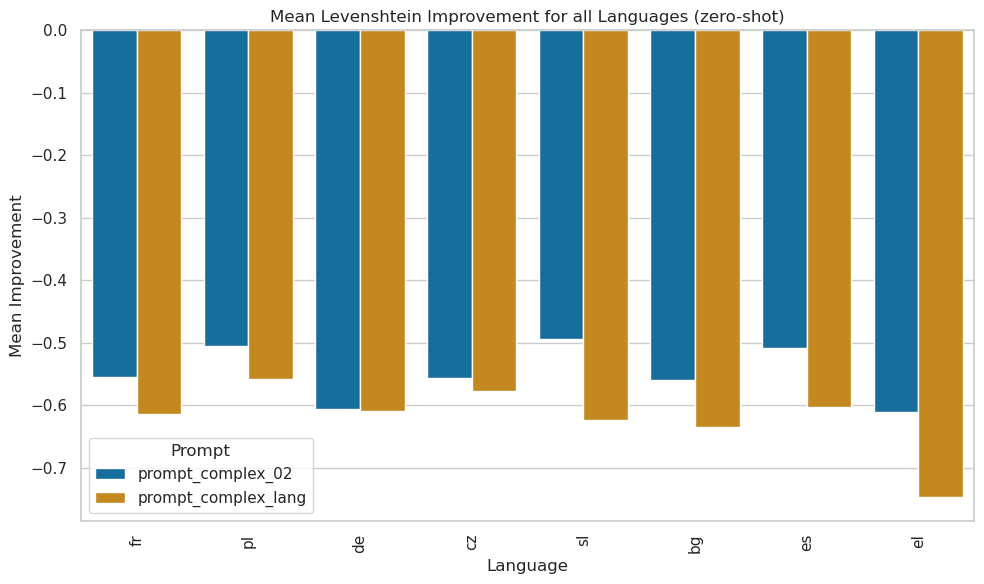

In [95]:
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=1.)


prompts_to_compare = ['prompt_complex_02', 'prompt_complex_lang']
languages = [lang for lang in data['language'].unique() if lang != 'en']  # Exclude 'en' language

bar_data = []

for type_of_experiment in ['zero-shot']:
    for error_rate in ['lev']:
        for language in languages:
            for prompt in prompts_to_compare:
                sub_data = data[(data.language == language) & 
                                 (data.type == type_of_experiment) & 
                                 (data.prompt == prompt)]
                if 'icdar' not in dataset:
                    sub_data['overall-levenshtein-improvement'] = sub_data[[f'line-{error_rate}-improvement', 
                                                                          f'sentence-{error_rate}-improvement', 
                                                                          f'region-{error_rate}-improvement']].mean(axis=1)
                else:
                    sub_data['overall-levenshtein-improvement'] = sub_data[[f'sentence-{error_rate}-improvement', 
                                                                      f'region-{error_rate}-improvement']].mean(axis=1)
                
                mean_improvement = np.mean(sub_data['overall-levenshtein-improvement'])
                bar_data.append({'Language': language, 'Prompt': prompt, 'Mean Improvement': mean_improvement})

bar_data = pd.DataFrame(bar_data)

plt.figure(figsize=(10, 6))
sns.barplot(x='Language', y='Mean Improvement', hue='Prompt', data=bar_data, hue_order=prompts_to_compare)
plt.title(f'Mean Levenshtein Improvement for all Languages ({type_of_experiment})')
plt.xticks(rotation=90)  # Rotate x-axis labels for better visibility
plt.tight_layout()
plt.show()


In [ ]:
data.columns

In [ ]:
data.dataset_name.unique()

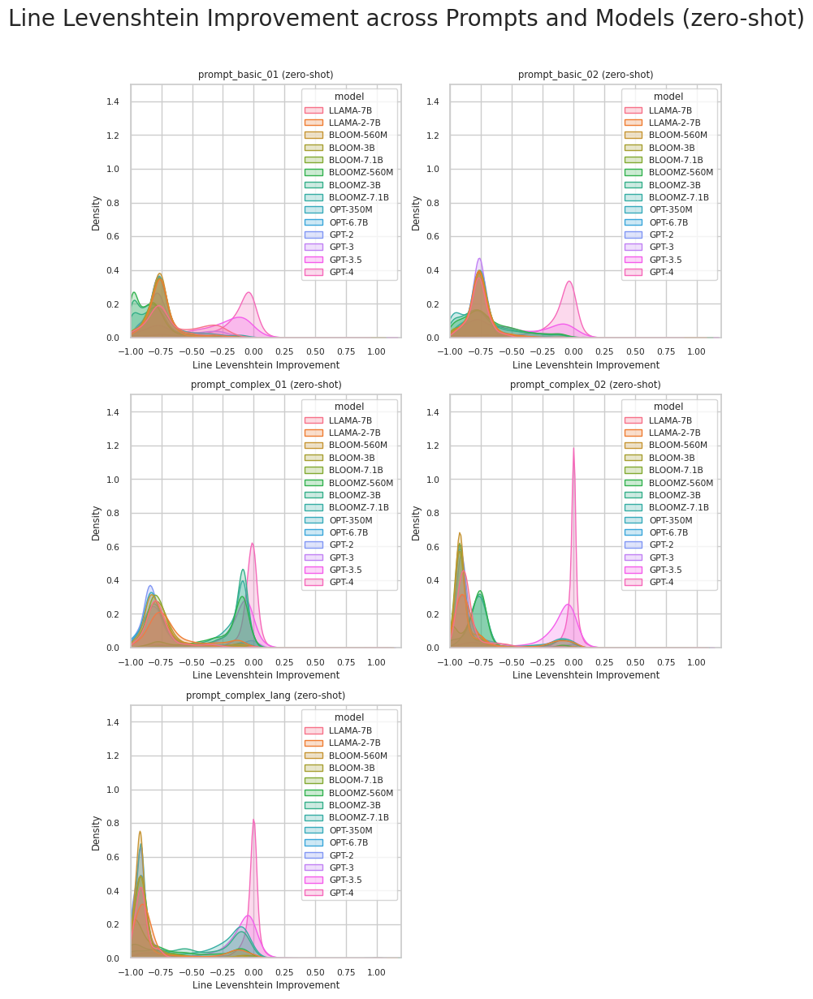

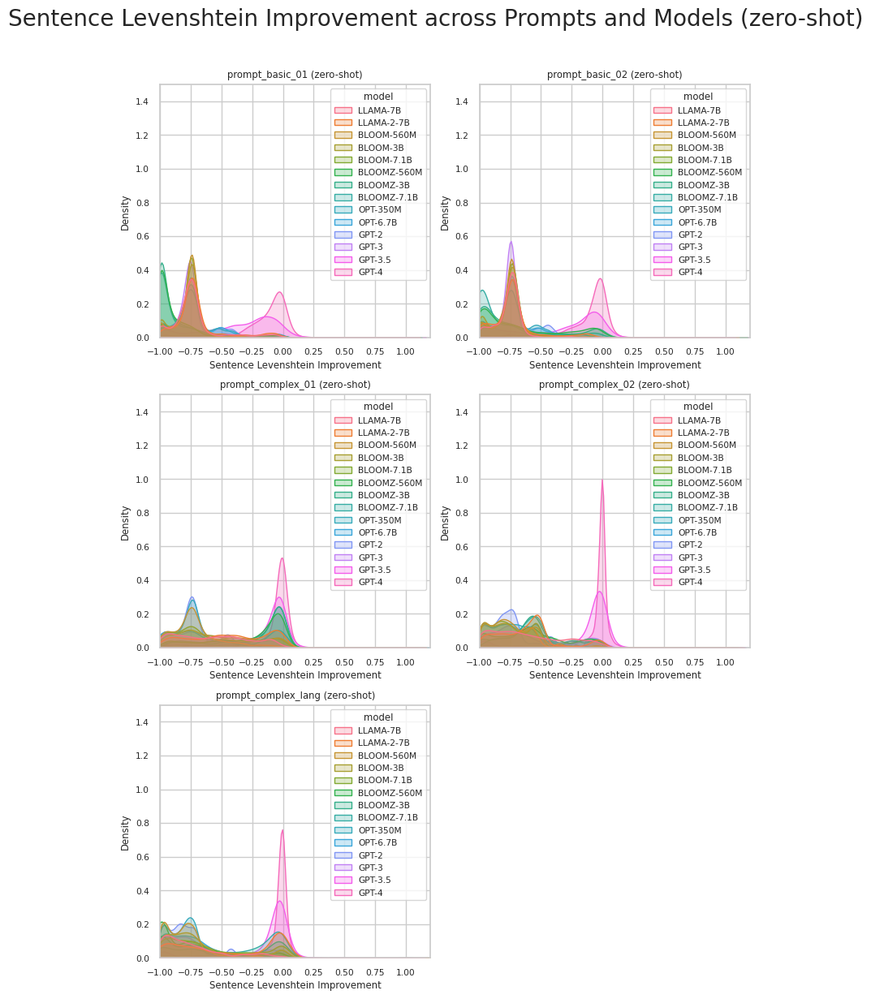

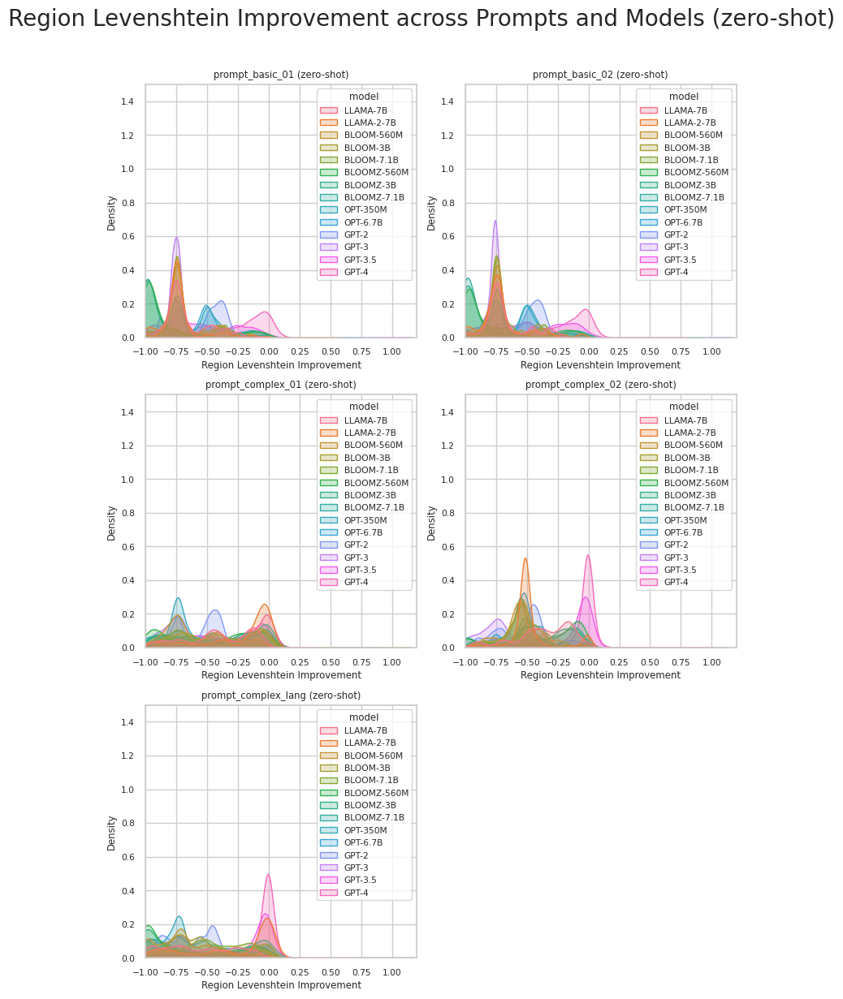

In [96]:
import seaborn as sns
import matplotlib.pyplot as plt

sns.set_palette('colorblind')
sns.set_context("notebook", font_scale=.7)

segmentations = ['line', 'sentence', 'region']

for type_of_experiment in ['zero-shot']:
    for error_rate in ['lev']:
        for segmentation in segmentations:
            fig, axs = plt.subplots(3, 2, figsize=(8, 12))  # Change here
            axs = axs.flatten()  # To make it easy to index

            for i, prompt in enumerate(prompt_names):
                prompt_data = data[(data.prompt == prompt) & (data.type == type_of_experiment)]
                if segmentation == 'line':
                    prompt_data = prompt_data[~prompt_data.dataset_name.isin(['icdar-2017', 'icdar-2019'])]
                prompt_data[f'{segmentation.capitalize()} Levenshtein Improvement'] = prompt_data[f'{segmentation}-{error_rate}-improvement']

                try:
                    if len(prompt_data) > 0:
                        sns.kdeplot(data=prompt_data, x=f'{segmentation.capitalize()} Levenshtein Improvement', 
                                    hue='model', fill=True, ax=axs[i], hue_order=MODELS)
                        axs[i].set_title(f'{prompt} ({type_of_experiment})')
                        axs[i].set_xlim([-1, 1.2])
                        axs[i].set_ylim([0, 1.5])
                except Exception as ex:
                    print(f'Could not plot {prompt} with {ex}')

            # Remove empty subplot
            fig.delaxes(axs[-1])  # Change here

            plt.suptitle(f'{segmentation.capitalize()} Levenshtein Improvement across Prompts and Models ({type_of_experiment})', fontsize=20, y=1.02)
            plt.tight_layout()
            plt.show()


In [ ]:
data.columns

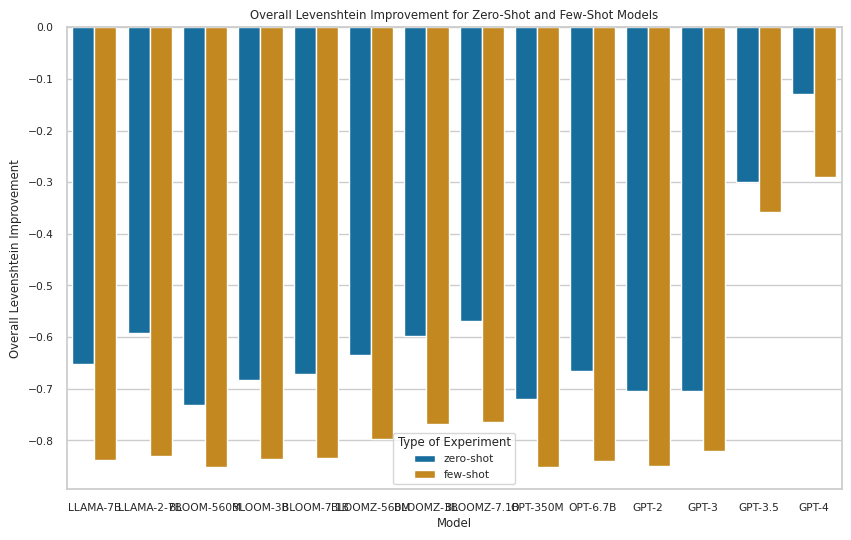

In [97]:
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np

results_df = []  # Define results as a list


for type_of_experiment in ['zero-shot', 'few-shot']:
    for model in MODELS:
        model_data = data[(data.model == model) & (data.type == type_of_experiment)]
        
        # Compute the mean Levenshtein Improvement across line, sentence, and region levels
        if 'icdar' not in dataset:
            model_data['overall-levenshtein-improvement'] = model_data[[f'line-lev-improvement', 
                                                                        f'sentence-lev-improvement', 
                                                                        f'region-lev-improvement']].mean(axis=1)
        else:
            model_data['overall-levenshtein-improvement'] = model_data[[f'sentence-lev-improvement', 
                                                                        f'region-lev-improvement']].mean(axis=1)

        # Append the results
#         print(model_data['Improvement Band'].unique())
        results_df.append({'Model': model,
                        'Type of Experiment': type_of_experiment,
                        'Overall Levenshtein Improvement': np.nanmean(model_data['overall-levenshtein-improvement'])})

# Convert the results list to a DataFrame for plotting
results_df = pd.DataFrame(results_df)

# Create the plot
plt.figure(figsize=(10,6))
sns.barplot(x='Model', y='Overall Levenshtein Improvement', hue='Type of Experiment', data=results_df, order=MODELS)
plt.title('Overall Levenshtein Improvement for Zero-Shot and Few-Shot Models')
plt.show()
